In [1]:
import pandas as pd
import numpy as np
import textwrap
import matplotlib.pyplot as plt
import seaborn as sns
import os

## bio match

In [2]:
bio_all = pd.read_csv('/itf-fi-ml/shared/users/ziyuzh/svm/results/bio_sim_all.csv')
additionL_metrics = pd.read_csv('/itf-fi-ml/shared/users/ziyuzh/svm/results/additinal_metrics.csv')

In [ ]:
bio_all['method'].unique(),bio_all['feature'].unique()
bio_all['setting'] = bio_all['method']
bio_all['method'] = bio_all['feature']
bio_all.to_csv('/itf-fi-ml/shared/users/ziyuzh/svm/results/bio_sim_all.csv',index=False)

In [4]:
additionL_metrics['setting'].unique(),additionL_metrics['method'].unique()

(array(['2019_occ_deep_svd_pred/pred.pkl', '2019_mf_bag_2_pred',
        'df_gnn_occsvm_pred', '2019_nn_all_pred', '2019_rf_renamed_pred'],
       dtype=object),
 array(['uniport_ppi_2019', 'ppi_emb_dw', 'seq_emb_esm', 'Graph_sage',
        'early_fused_ppi', 'early_fused', 'mid_linear_fused',
        'late_fused_ppi', 'GCNs', 'mid_geo_fused_ppi', 'literature_emb',
        'ppi_emb_n2v', 'ppi_emb_df', 'late_fused', 'mid_linear_fused_ppi',
        'occ_svm', 'seq_emb_port', 'mid_geo_fused', 'mid_fused',
        'mid_fused_ppi'], dtype=object))

In [6]:
bio_add = pd.read_csv('/itf-fi-ml/shared/users/ziyuzh/svm/results/bio_sim_add.csv')

In [7]:
bio_add['method'].unique(),bio_add['feature'].unique()

(array(['df_gnn_occsvm_pred', '2019_occ_deep_svd_pred', '2019_nn_all_pred',
        '2019_rf_renamed_pred', '2019_mf_bag_2_pred'], dtype=object),
 array(['early_fused', 'early_fused_ppi', 'late_fused', 'late_fused_ppi',
        'ppi_emb_n2v', 'ppi_emb_dw', 'ppi_emb_df', 'literature_emb',
        'seq_emb_esm', 'seq_emb_port', 'mid_linear_fused', 'mid_geo_fused',
        'mid_linear_fused_ppi', 'mid_geo_fused_ppi', 'occ_svm', 'GCNs',
        'Graph_sage', 'uniport_ppi_2019', 'mid_fused', 'mid_fused_ppi'],
       dtype=object))

In [8]:
bio_add['method'] = bio_add['method'].replace({
    '2019_occ_deep_svd_pred': '2019_occ_deep_svd_pred/pred.pkl'
})
bio_add['setting'] = bio_add['method']
bio_add['method'] = bio_add['feature']
bio_add['method'].unique(),bio_add['setting'].unique()

(array(['early_fused', 'early_fused_ppi', 'late_fused', 'late_fused_ppi',
        'ppi_emb_n2v', 'ppi_emb_dw', 'ppi_emb_df', 'literature_emb',
        'seq_emb_esm', 'seq_emb_port', 'mid_linear_fused', 'mid_geo_fused',
        'mid_linear_fused_ppi', 'mid_geo_fused_ppi', 'occ_svm', 'GCNs',
        'Graph_sage', 'uniport_ppi_2019', 'mid_fused', 'mid_fused_ppi'],
       dtype=object),
 array(['df_gnn_occsvm_pred', '2019_occ_deep_svd_pred/pred.pkl',
        '2019_nn_all_pred', '2019_rf_renamed_pred', '2019_mf_bag_2_pred'],
       dtype=object))

In [9]:
bio_add.to_csv('/itf-fi-ml/shared/users/ziyuzh/svm/results/bio_sim_add.csv',index=False)

## recall_bedroc_metrics

In [8]:
additionL_metrics['setting'].unique(),additionL_metrics['method'].unique()

(array(['2019_occ_deep_svd_pred/pred.pkl', '2019_mf_bag_2_pred',
        'df_gnn_occsvm_pred', '2019_nn_all_pred', '2019_rf_renamed_pred'],
       dtype=object),
 array(['uniport_ppi_2019', 'ppi_emb_dw', 'seq_emb_esm', 'Graph_sage',
        'early_fused_ppi', 'early_fused', 'mid_linear_fused',
        'late_fused_ppi', 'GCNs', 'mid_geo_fused_ppi', 'literature_emb',
        'ppi_emb_n2v', 'ppi_emb_df', 'late_fused', 'mid_linear_fused_ppi',
        'occ_svm', 'seq_emb_port', 'mid_geo_fused', 'mid_fused',
        'mid_fused_ppi'], dtype=object))

In [10]:
len(set(additionL_metrics['method'].unique()) & set(bio_all['feature'].unique()))

20

In [11]:
len(set(additionL_metrics['method'].unique()))

20

In [ ]:
selected_pairs = [['df_gnn_occsvm_pred','occ_svm'],
            ['df_gnn_occsvm_pred','ppi_emb_n2v'],
            ['2019_nn_all_pred','ppi_emb_n2v'],
            ['2019_occ_deep_svd_pred/pred.pkl','uniport_ppi_2019']]

In [12]:
root = '/itf-fi-ml/shared/users/ziyuzh/svm/results/'

In [128]:
folders = ['2019_df_oob', '2019_nn_oob_all', '2019_rf_all','2019_occ_all','2019_gnn','2019_mf_bag_2']

folder = '2019_gnn'
file_path = os.path.join(root, folder + '.xlsx')
temp_df = pd.read_excel(file_path, sheet_name='disease')

In [85]:
temp_df.columns

Index(['method', 'para', 'top_recall_25', 'top_recall_300', 'top_recall_10%',
       'top_recall_30%', 'auroc', 'rank_ratio', 'bedroc_1', 'bedroc_5',
       'bedroc_10', 'bedroc_30', 'weights_1', 'weights_2', 'weights_3',
       'disease', 'category'],
      dtype='object')

In [84]:
temp_df['para'].unique(),temp_df['method'].unique()

(array(['uniport_ppi_2019'], dtype=object),
 array(['random_negative'], dtype=object))

In [ ]:
mapping = {
    'occ':'df_gnn_occsvm_pred',
    'occ_deep_svd':'2019_occ_deep_svd_pred/pred.pkl'
}
temp_df['setting'] = temp_df['method']
temp_df['setting'] = temp_df['setting'].replace(mapping)

In [130]:
mapping = {
    'occ':'occ_svm',
    'occ_deep_svd':'uniport_ppi_2019',
    'gcn':'GCNs',
    'sage':'Graph_sage'
}

temp_df['method'] = temp_df['para'].replace(mapping)

In [131]:
temp_df['setting'] = 'df_gnn_occsvm_pred'
# temp_df['method'] = 'uniport_ppi_2019'

In [57]:
mapping = {
    'uniport_ppi_2019': 'ppi_emb_n2v',
    'ppi_2019_dw_40':'ppi_emb_dw',
    'diffusion_2019': 'ppi_emb_df',
    'uniport_bio': 'literature_emb',
    'uniport_esm': 'seq_emb_esm',
    'uniport_seq':'seq_emb_port',
    'later_feature_fused_avg':'late_fused',
    'later_ppi_feature_fused_avg':'late_fused_ppi',
    'early_ppi':'early_fused_ppi',
    'early':'early_fused',
    'mid':'mid_fused',
    'mid_ppi':'mid_fused_ppi',
    'later_mlp':'late_fused',
    'later_mlp_ppi':'late_fused_ppi'}
temp_df = temp_df.replace('linear_', 'mid_linear_', regex=True)    
temp_df = temp_df.replace('geo_', 'mid_geo_', regex=True)
temp_df = temp_df.replace('DL_', '', regex=True)
temp_df = temp_df.replace('RF_', '', regex=True)
temp_df = temp_df.replace('diffusion_2019_2', 'diffusion_2019', regex=True)

temp_df['method'] = temp_df['para'].replace(mapping)

In [81]:
temp_df['setting'].unique(),temp_df['method'].unique()

(array(['df_gnn_occsvm_pred'], dtype=object),
 array(['GCNs', 'Graph_sage'], dtype=object))

In [71]:
len(set(additionL_metrics['method'].unique()) & set(temp_df['method'].unique()))

2

In [31]:
[m for m in temp_df['method'].unique() if m.startswith('lat')]

['later_feature_fused',
 'late_fused',
 'later_ppi_feature_fused',
 'late_fused_ppi']

In [32]:
[m for m in additionL_metrics['method'].unique() if m.startswith('lat')]

['late_fused_ppi', 'late_fused']

In [87]:
set(additionL_metrics['method'].unique()) & set(temp_df['method'].unique())

{'uniport_ppi_2019'}

In [ ]:
# temp_df = temp_df[~(temp_df['method']=='early_fused')]

In [88]:
temp_df.to_csv('temp_mf_results.csv',index=False)

In [132]:
temp_df.to_csv('temp_gnn_results.csv',index=False)

In [73]:
temp_df.to_csv('temp_occ_results.csv',index=False)

In [64]:
temp_df.to_csv('temp_rf_results.csv',index=False)

In [52]:
temp_df.to_csv('temp_nn_results.csv',index=False)

In [43]:
temp_df.to_csv('temp_oob_results.csv',index=False)

In [134]:
files = [
    'temp_mf_results.csv',
    'temp_gnn_results.csv',
    'temp_occ_results.csv',
    'temp_rf_results.csv',
    'temp_nn_results.csv',
    'temp_oob_results.csv'
]

# Read and merge row-wise
df = pd.concat([pd.read_csv(f) for f in files], ignore_index=True)

# Save merged file
# df.to_csv('merged_results.csv', index=False)


In [ ]:
df = df.drop(columns=['para'])
df.to_csv('/itf-fi-ml/shared/users/ziyuzh/svm/results/recall_bedroc_metrics.csv', index=False)


## merge

In [9]:
df = pd.read_csv('/itf-fi-ml/shared/users/ziyuzh/svm/results/recall_bedroc_metrics.csv')
bio_all = pd.read_csv('/itf-fi-ml/shared/users/ziyuzh/svm/results/bio_sim_all.csv')
additionL_metrics = pd.read_csv('/itf-fi-ml/shared/users/ziyuzh/svm/results/additinal_metrics.csv')

In [10]:
merged_df = df.merge(
    additionL_metrics,
    on=['disease','setting', 'method'],
    how='inner'
)

In [11]:
len(merged_df['disease'].unique()),len(df['disease'].unique()),len(additionL_metrics['disease'].unique())

(48, 49, 48)

In [12]:
merged_df = merged_df.merge(
    bio_all,
    on=['disease','setting', 'method'],
    how='inner'
)

In [14]:
len(merged_df['disease'].unique()),len(bio_all['disease'].unique()),len(additionL_metrics['disease'].unique())

(48, 48, 48)

In [24]:
mapping = {
    'Neoplasms': 'Neoplasms(8)',
    'Diseases of the circulatory system': 'Diseases of the circulatory system(7)',
    'Diseases of the nervous system': 'Diseases of the nervous system(7)',
    'Diseases of the genitourinary system': 'Diseases of the genitourinary system(6)',
    'Mental and behavioural disorders': 'Mental and behavioural disorders(5)',
    'Diseases of the musculoskeletal system and connective tissue': 'Diseases of the musculoskeletal system and connective tissue(3)',
    'Diseases of the respiratory system': 'Diseases of the respiratory system(3)',
    'Diseases of the blood and blood-forming organs and certain disorders involving the immune mechanism': 'Diseases of the blood and certain disorders(3)',
    'Endocrine, nutritional and metabolic diseases': 'Endocrine, nutritional and metabolic diseases(2)',
    'Diseases of the digestive system': 'Diseases of the digestive system(2)',
    'Diseases of the skin and subcutaneous tissue': 'Diseases of the skin and subcutaneous tissue(2)'
}
merged_df['category'] = merged_df['category'].map(mapping)

In [26]:
merged_df.to_csv('/itf-fi-ml/shared/users/ziyuzh/svm/results/all_metrics.csv',index=False)

In [ ]:
bio_add = pd.read_csv('/itf-fi-ml/shared/users/ziyuzh/svm/results/bio_sim_add.csv')
merged_df = pd.read_csv('/itf-fi-ml/shared/users/ziyuzh/svm/results/all_metrics.csv')

merged_df = merged_df.merge(
    bio_add,
    on=['disease','setting', 'method'],
    how='inner'
)

merged_df.to_csv('/itf-fi-ml/shared/users/ziyuzh/svm/results/all_metrics.csv',index=False)

## visual

In [2]:
# merged_df = pd.read_csv('/itf-fi-ml/shared/users/ziyuzh/svm/results/all_metrics.csv')
merged_df = pd.read_csv('/itf-fi-ml/shared/users/ziyuzh/svm/results/all_metrics_1and2percent.csv')


import matplotlib.pyplot as plt
import seaborn as sns
import textwrap
import pandas as pd

def plot_metric_boxplot(filter_df, metric, legend_order):
    """
    Plot a boxplot comparison across disease categories.

    Parameters
    ----------
    filter_df : pandas.DataFrame
        Must contain ['category', 'method', metric]
    metric : str
        Column name of metric to plot (e.g., 'auroc', 'auprc')
    legend_order : list
        Order of methods in legend and inside each category
    """

    # ---- Work on a copy (prevents SettingWithCopyWarning) ----
    df = filter_df.copy()

    # ---- Explicit method order ----
    df["method"] = pd.Categorical(
        df["method"],
        categories=legend_order,
        ordered=True
    )

    # ---- Category ordering by mean metric (explicit observed=True removes FutureWarning) ----
    cat_order = (
        df.groupby("category", observed=True)[metric]
        .mean()
        .sort_values(ascending=False)
        .index
    )

    df["category"] = pd.Categorical(
        df["category"],
        categories=cat_order,
        ordered=True
    )

    df = df.sort_values(["category", "method"]).reset_index(drop=True)

    plt.figure(figsize=(15, 6))

    ax = sns.boxplot(
        data=df,
        x="category",
        y=metric,
        hue="method",
        order=cat_order,
        hue_order=legend_order,
        palette="Set2",
    )

    # ---- Safe label wrapping (no tick warning) ----
    labels = ax.get_xticklabels()
    new_labels = [textwrap.fill(lbl.get_text(), width=30) for lbl in labels]

    ax.set_xticklabels(new_labels, rotation=40, ha='center')

    # ---- Legend (already ordered by hue_order) ----
    ax.legend(
        title="Methods",
        bbox_to_anchor=(1.05, 1),
        loc="upper left"
    )

    plt.title(f"{metric.upper()} Comparison Across Disease Categories", fontsize=13)
    # plt.xlabel("Disease Category", fontsize=15)
    plt.ylabel(metric.upper(), fontsize=10)

    plt.tight_layout()
    plt.show()


In [3]:
merged_df.columns

Index(['disease', 'setting', 'method', 'category', 'bio_sim_300',
       'bio_sim_150', 'top_recall_150', 'succ_150', 'w_recall_150',
       'top_recall_300', 'succ_300', 'w_recall_300', 'bedroc_150',
       'bedroc_300', 'auroc'],
      dtype='object')

In [ ]:
# selected_metrics = [
#         'auroc','top_recall_150', 'bedroc_150','succ_150', 
#        'top_recall_300', 'succ_300','bedroc_300',
#        'bio_sim_150', 'bio_sim_300']
selected_metrics = [
       'top_recall_300', 'bedroc_300', 'auroc','bio_sim_300']

## occ

/tmp/ipykernel_1323184/2447229417.py:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


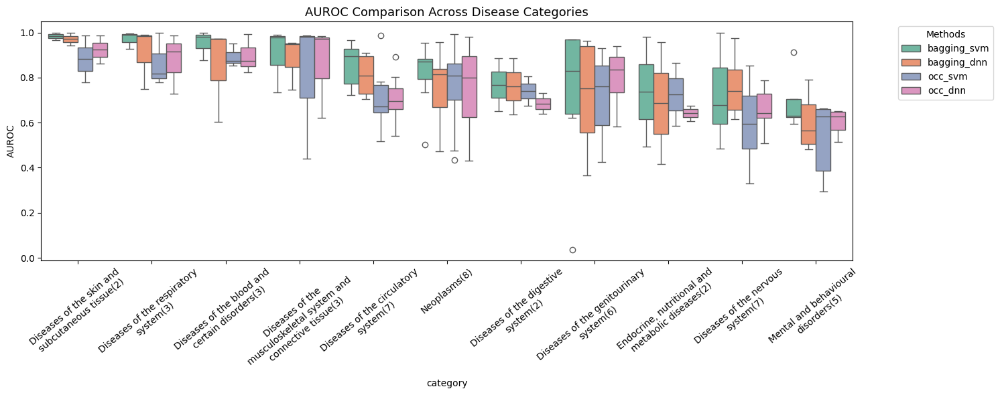

/tmp/ipykernel_1323184/2447229417.py:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


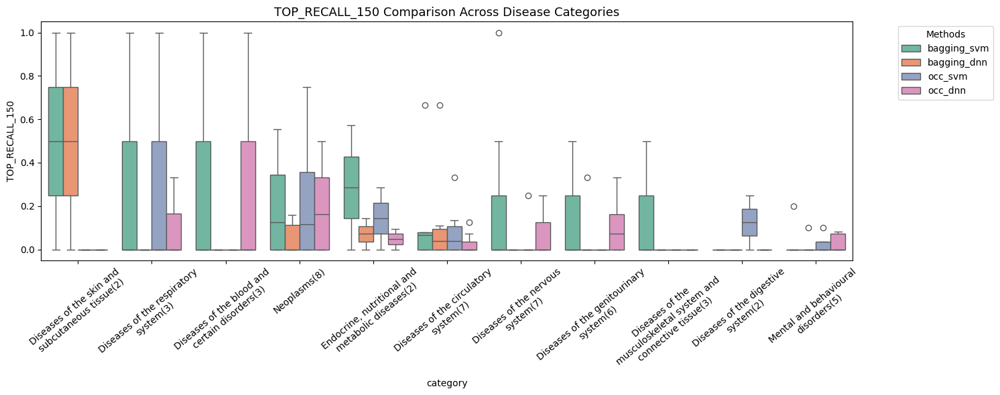

/tmp/ipykernel_1323184/2447229417.py:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


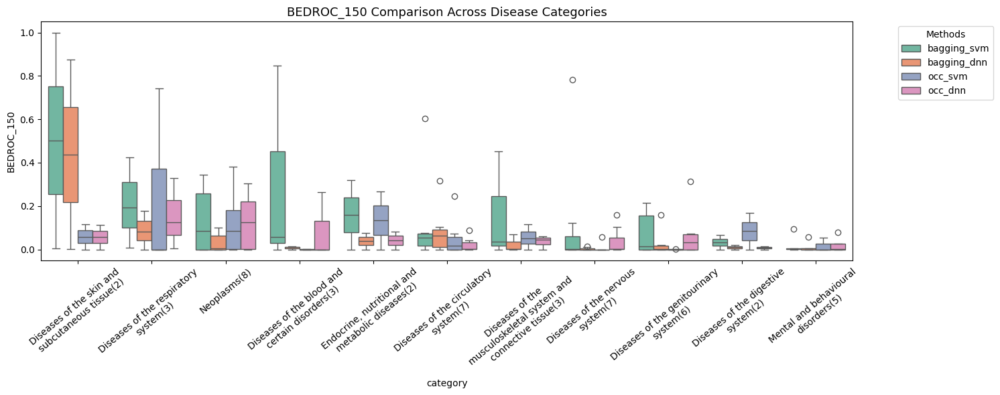

/tmp/ipykernel_1323184/2447229417.py:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


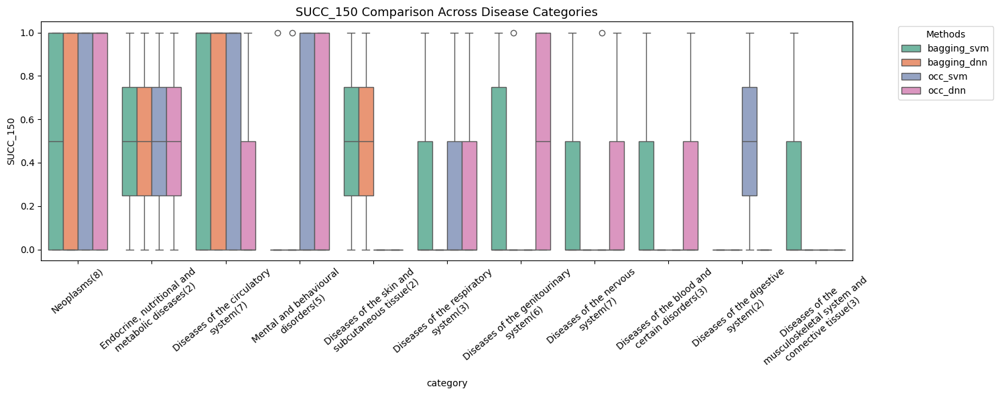

/tmp/ipykernel_1323184/2447229417.py:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


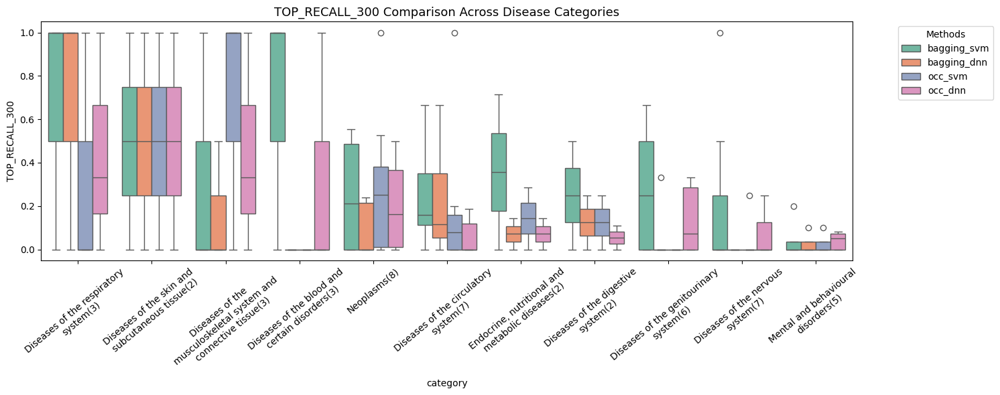

/tmp/ipykernel_1323184/2447229417.py:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


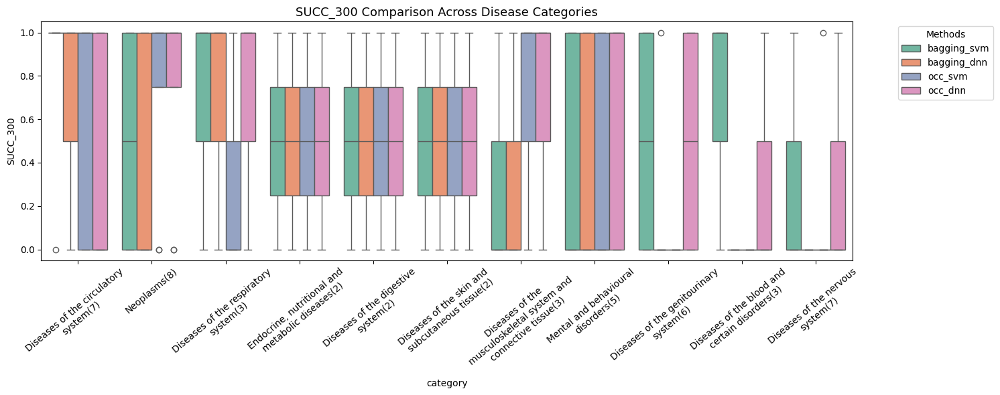

/tmp/ipykernel_1323184/2447229417.py:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


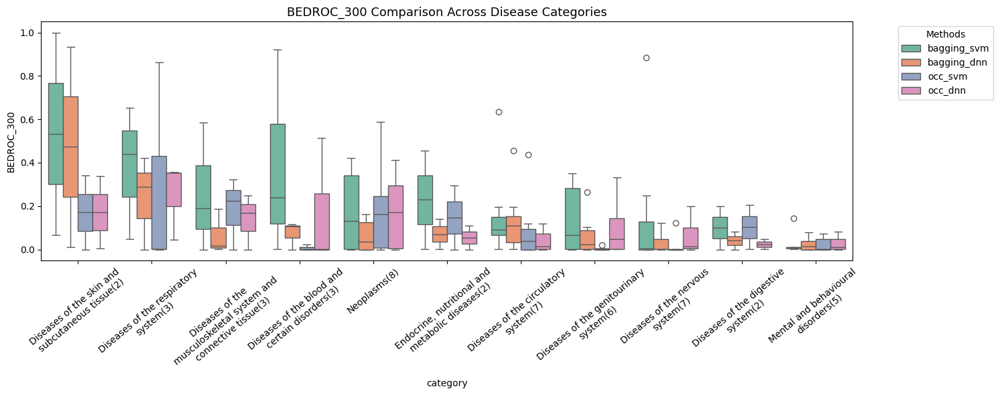

/tmp/ipykernel_1323184/2447229417.py:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


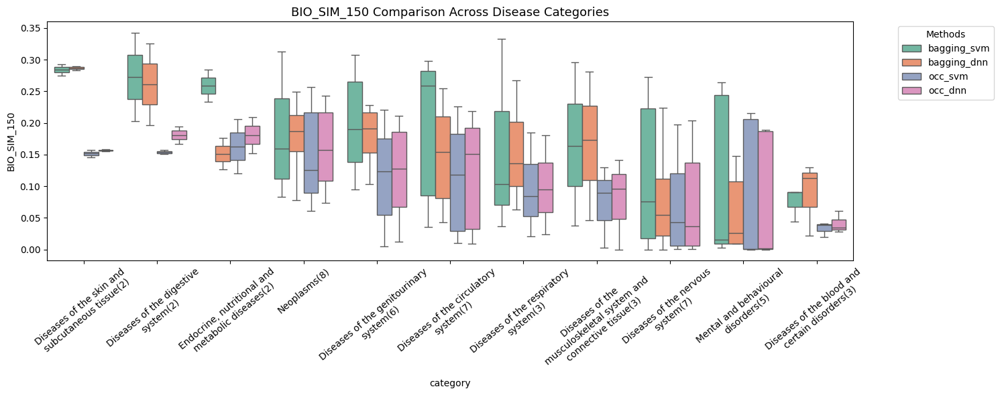

/tmp/ipykernel_1323184/2447229417.py:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


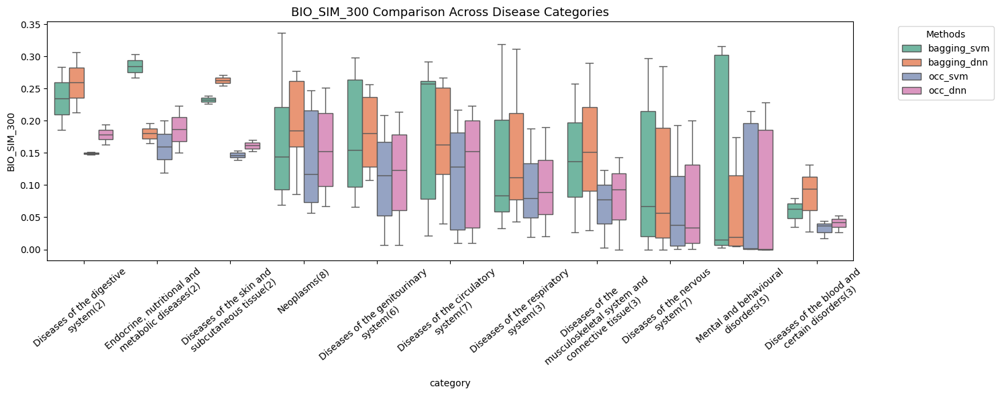

In [4]:
# Selected (setting, method) pairs
selected_pairs = [('df_gnn_occsvm_pred', 'occ_svm'),
    ('df_gnn_occsvm_pred', 'ppi_emb_n2v'),
    ('2019_nn_all_pred', 'ppi_emb_n2v'),
    ('2019_occ_deep_svd_pred/pred.pkl', 'uniport_ppi_2019')]

# Extract subset
subresults = (merged_df.set_index(['setting', 'method']).loc[selected_pairs].reset_index())

# Mapping from selected_pairs → new method names
method_mapping = dict(zip(selected_pairs,['occ_svm', 'bagging_svm', 'bagging_dnn', 'occ_dnn']))

# Apply mapping
subresults['method'] = [method_mapping[(row['setting'], row['method'])]for _, row in subresults.iterrows()]

# for metric in ['top_recall_25', 'top_recall_300','top_recall_10%', 'top_recall_30%', 
#                'auroc', 'bedroc_1','bedroc_5', 'bedroc_10', 'bedroc_30', 
#                'succ_1%', 'w_recall_1%', 'succ_5%','succ_10%',
#                'w_recall_5%',  'w_recall_10%', 
#                'cutoff_0.11%','cutoff_0.22%']:
for metric in selected_metrics:
    # plot_metric_boxplot(subresults, metric,[['bagging_svm', 'bagging_dnn', 'occ_svm', 'occ_dnn'],['Bagging_SVM', 'Bagging_DNN', 'OC_SVM', 'OC_DeepSVDD']])
    plot_metric_boxplot(subresults, metric,['bagging_svm', 'bagging_dnn', 'occ_svm', 'occ_dnn'])

## features

/tmp/ipykernel_2716722/1002364472.py:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


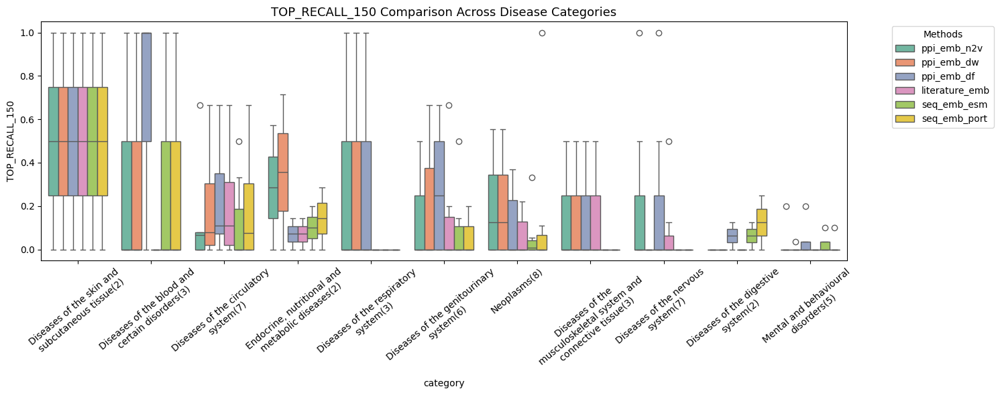

/tmp/ipykernel_2716722/1002364472.py:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


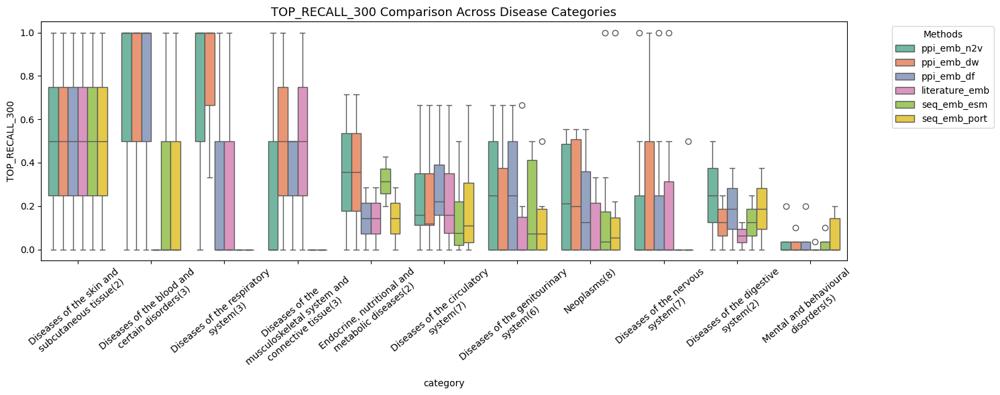

/tmp/ipykernel_2716722/1002364472.py:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


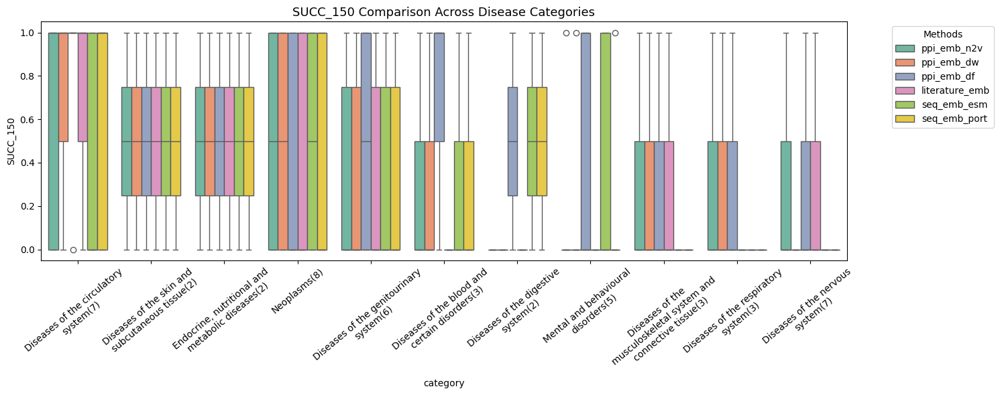

/tmp/ipykernel_2716722/1002364472.py:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


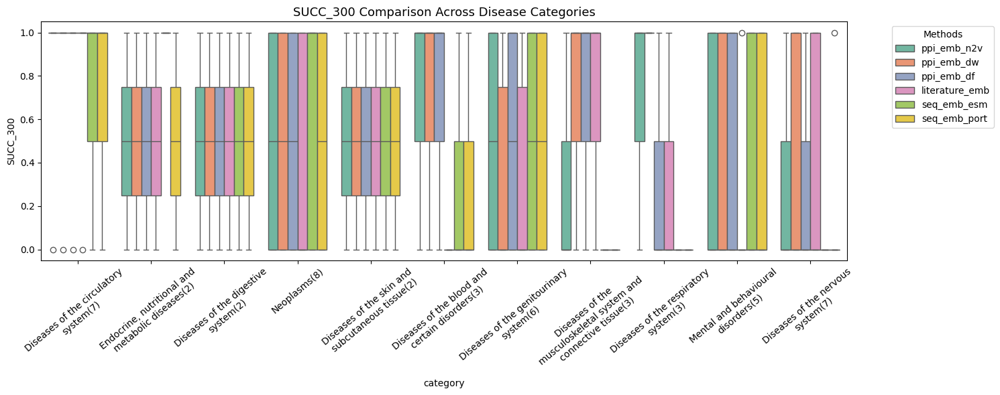

/tmp/ipykernel_2716722/1002364472.py:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


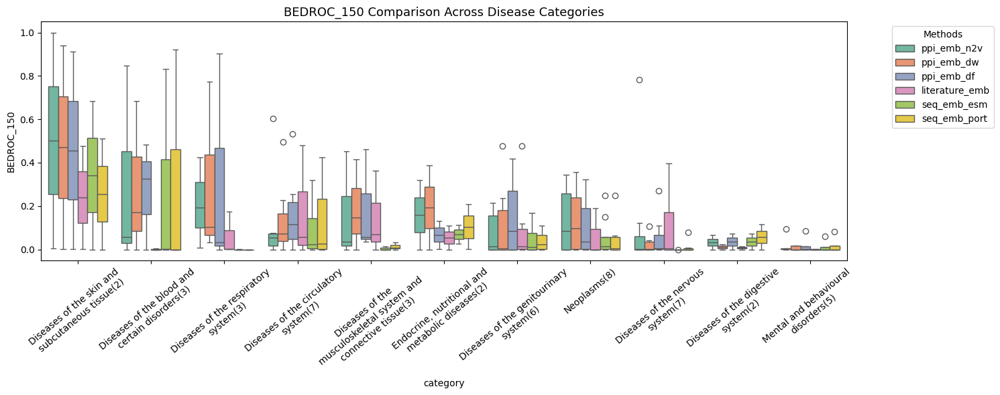

/tmp/ipykernel_2716722/1002364472.py:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


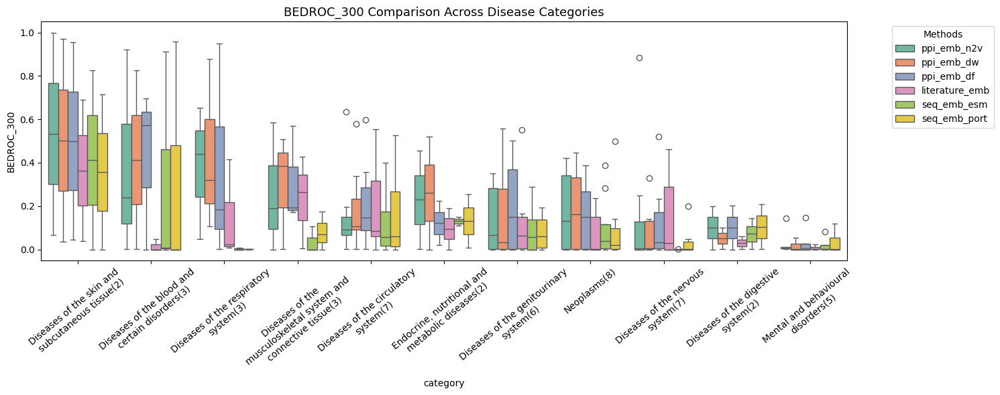

/tmp/ipykernel_2716722/1002364472.py:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


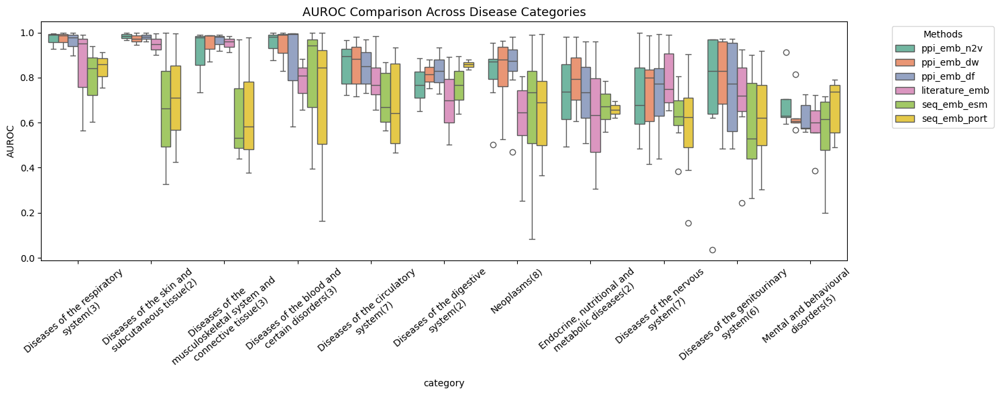

/tmp/ipykernel_2716722/1002364472.py:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


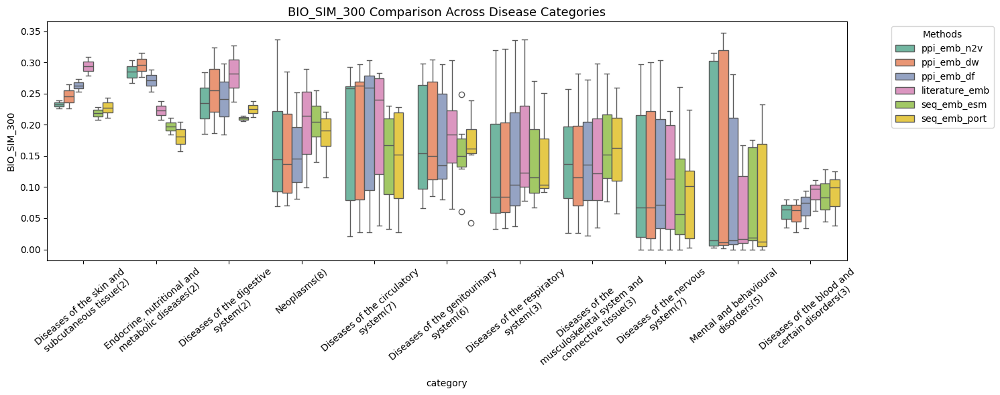

/tmp/ipykernel_2716722/1002364472.py:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


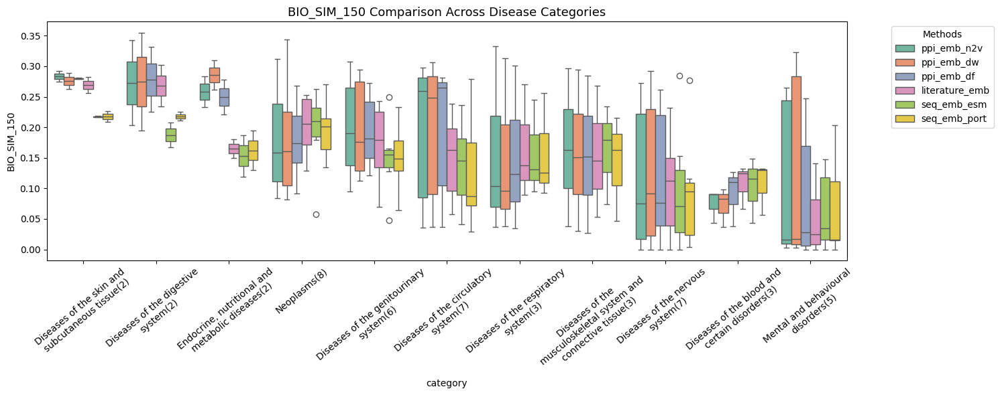

In [ ]:
selected_features = ['ppi_emb_df','ppi_emb_dw', 'ppi_emb_n2v', 'literature_emb','seq_emb_esm', 'seq_emb_port']

subresults = merged_df[(merged_df['setting']=='df_gnn_occsvm_pred')&(merged_df['method'].isin(selected_features))]


for metric in ['top_recall_150', 'top_recall_300',
               'succ_150', 'succ_300',  
               'bedroc_150','bedroc_300', 'auroc',
               'bio_sim_300','bio_sim_150' ]:
# for metric in ['top_recall_300','top_recall_10%', 
#                'auroc', 'bedroc_1','bedroc_5', 'bedroc_10',
#                'succ_5%','succ_10%',
#                'w_recall_5%',  'w_recall_10%', 
#                'cutoff_0.11%','cutoff_0.22%']:
    plot_metric_boxplot(subresults, metric,['ppi_emb_n2v', 'ppi_emb_dw', 'ppi_emb_df', 'literature_emb','seq_emb_esm', 'seq_emb_port'])

## models

/tmp/ipykernel_2716722/1002364472.py:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


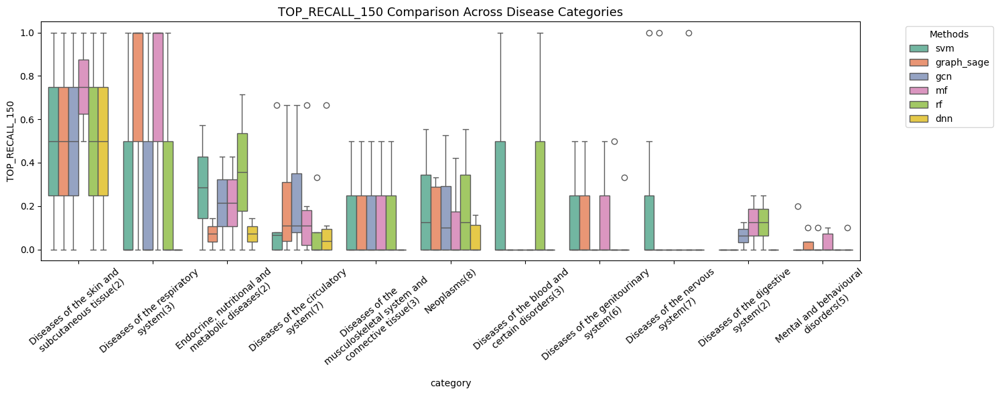

/tmp/ipykernel_2716722/1002364472.py:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


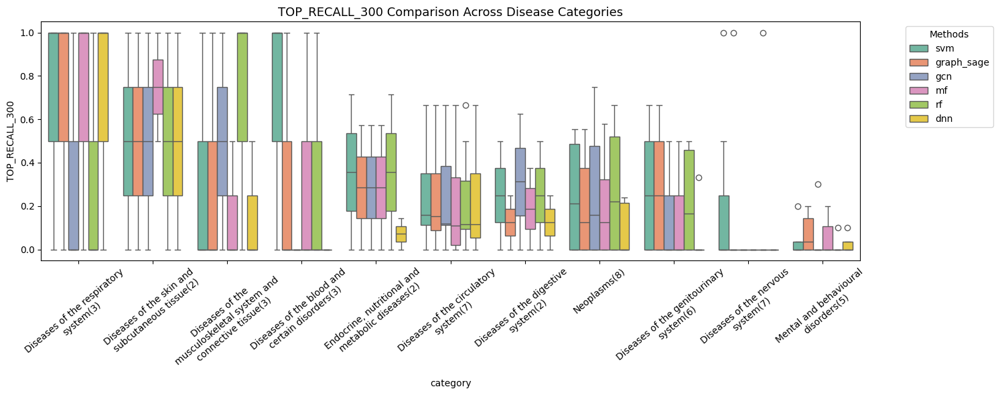

/tmp/ipykernel_2716722/1002364472.py:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


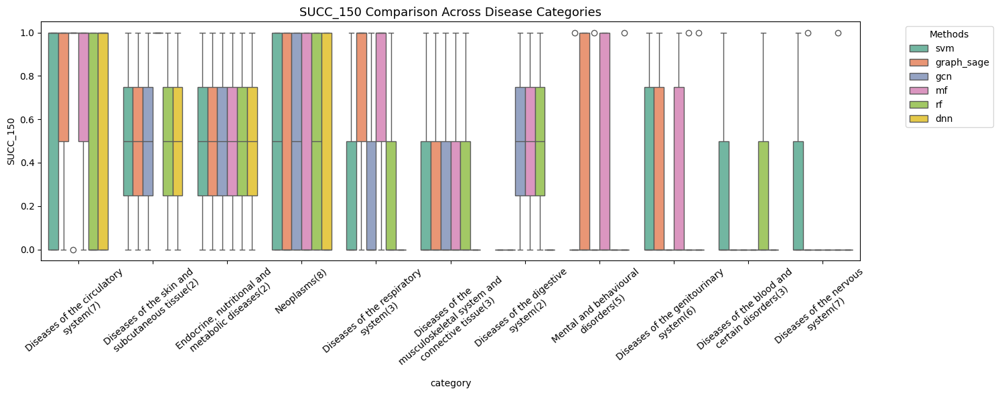

/tmp/ipykernel_2716722/1002364472.py:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


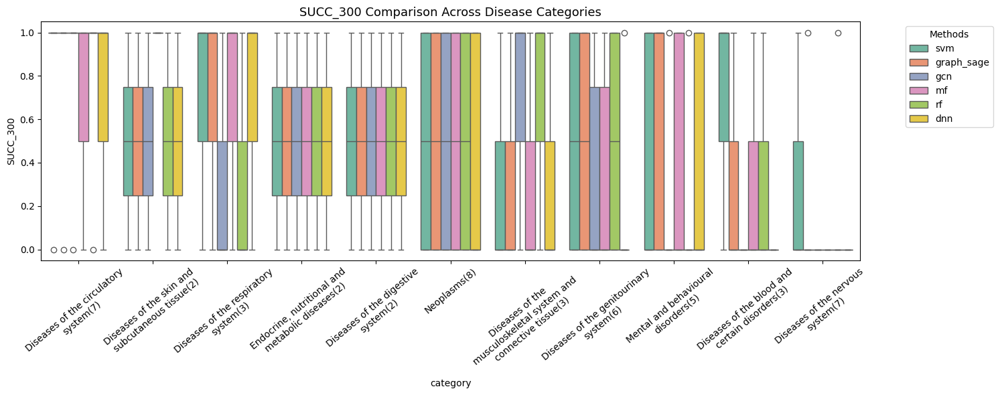

/tmp/ipykernel_2716722/1002364472.py:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


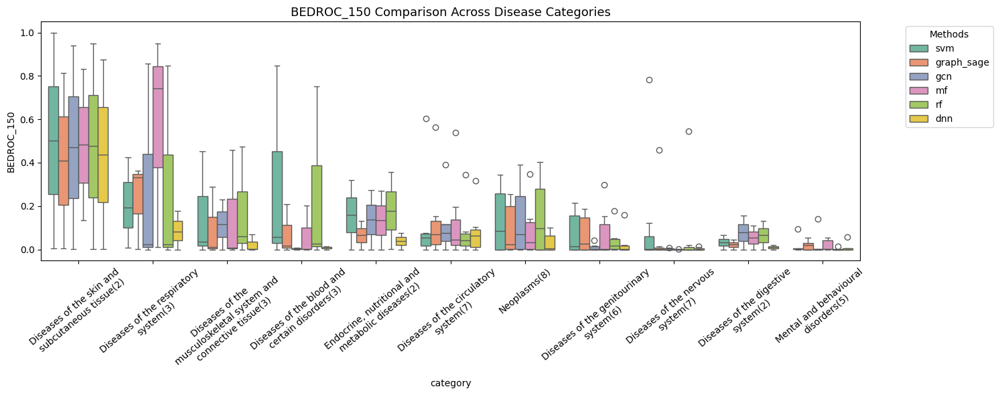

/tmp/ipykernel_2716722/1002364472.py:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


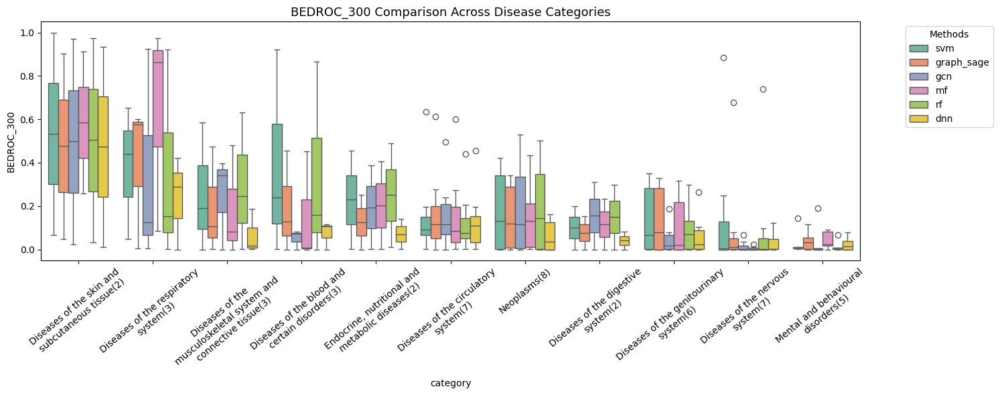

/tmp/ipykernel_2716722/1002364472.py:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


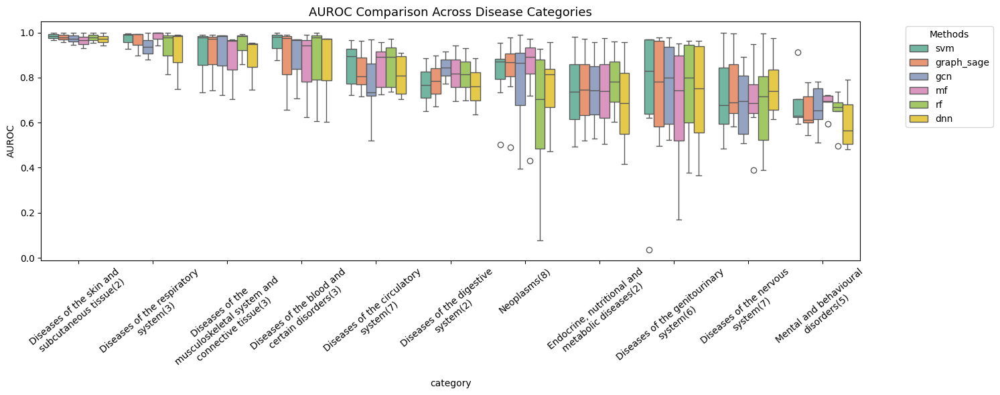

/tmp/ipykernel_2716722/1002364472.py:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


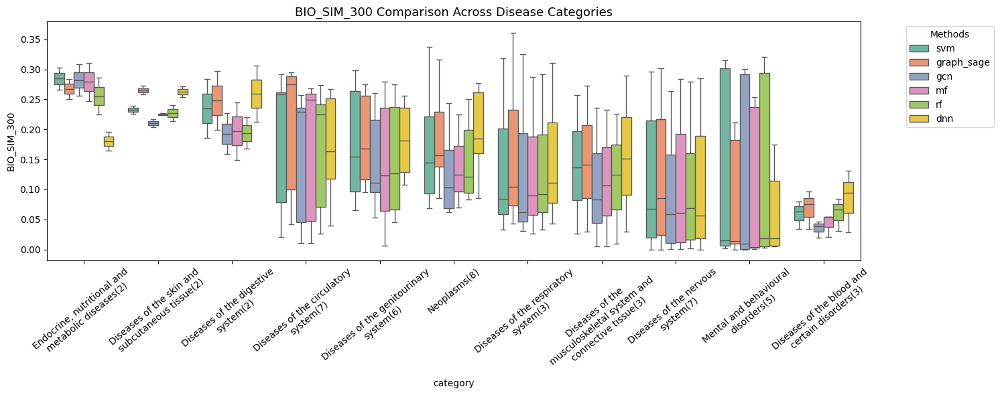

/tmp/ipykernel_2716722/1002364472.py:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


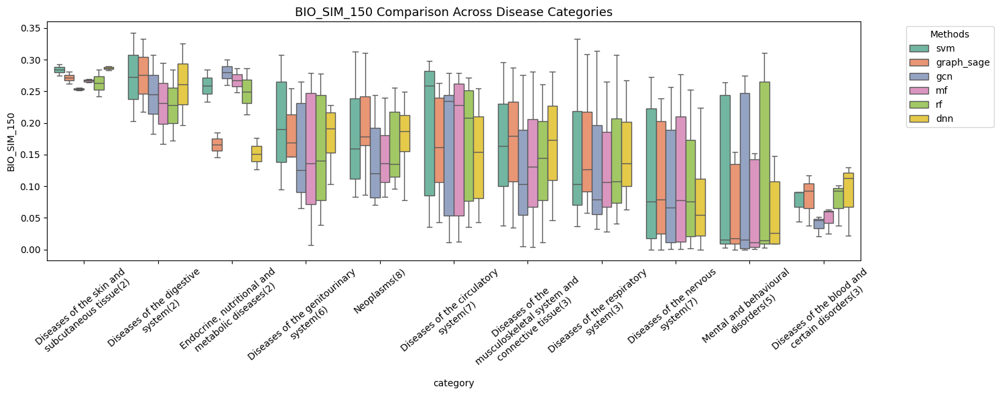

In [6]:
# Selected (setting, method) pairs
selected_pairs = [('df_gnn_occsvm_pred','ppi_emb_n2v'),
                  ('df_gnn_occsvm_pred','Graph_sage'),
                  ('df_gnn_occsvm_pred','GCNs'),
            ('2019_nn_all_pred','ppi_emb_n2v'),
            ('2019_rf_renamed_pred','ppi_emb_n2v'),
            ('2019_mf_bag_2_pred','uniport_ppi_2019')]

# Extract subset
subresults = (merged_df.set_index(['setting', 'method']).loc[selected_pairs].reset_index())

# Mapping from selected_pairs → new method names
method_mapping = dict(zip(selected_pairs,['svm','graph_sage','gcn','dnn','rf','mf']))

# Apply mapping
subresults['method'] = [method_mapping[(row['setting'], row['method'])]for _, row in subresults.iterrows()]

# for metric in ['top_recall_300','top_recall_10%', 
#                'auroc', 'bedroc_1','bedroc_5', 'bedroc_10',
#                'succ_5%','succ_10%',
#                'w_recall_5%',  'w_recall_10%', 
#                'cutoff_0.11%','cutoff_0.22%']:
for metric in ['top_recall_150', 'top_recall_300',
               'succ_150', 'succ_300',  
               'bedroc_150','bedroc_300', 'auroc',
               'bio_sim_300','bio_sim_150' ]:
    plot_metric_boxplot(subresults, metric,['svm','graph_sage','gcn','mf','rf','dnn'])

## fusion

/tmp/ipykernel_1283391/2447229417.py:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


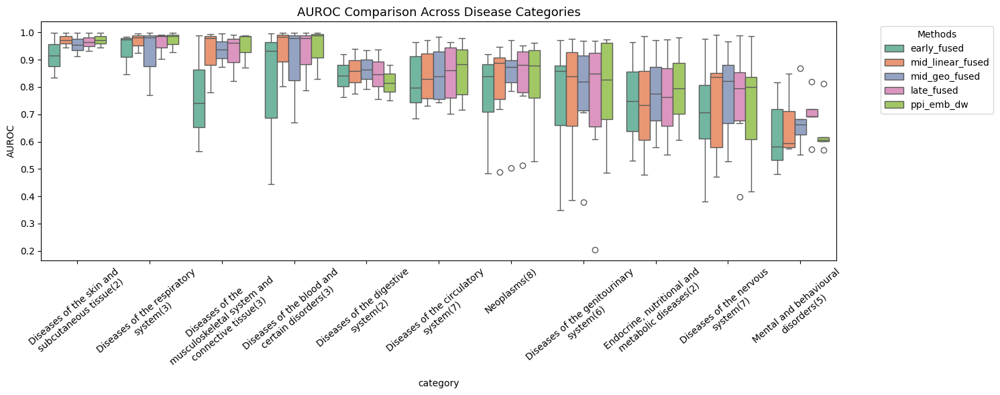

/tmp/ipykernel_1283391/2447229417.py:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


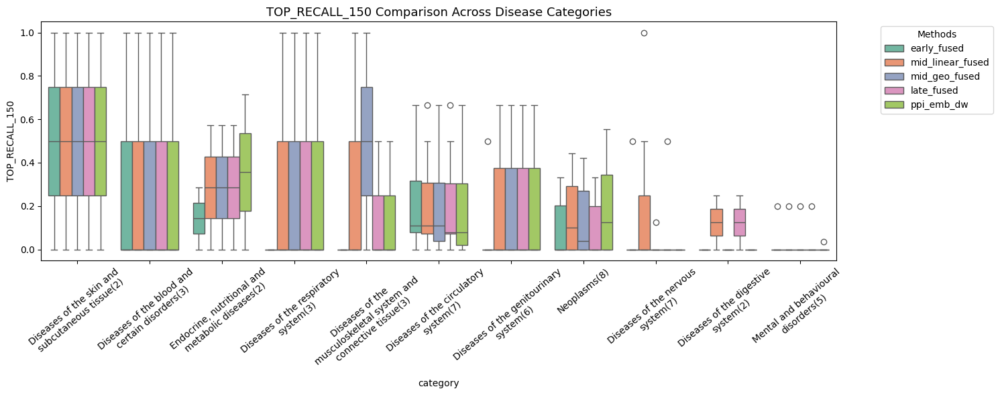

/tmp/ipykernel_1283391/2447229417.py:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


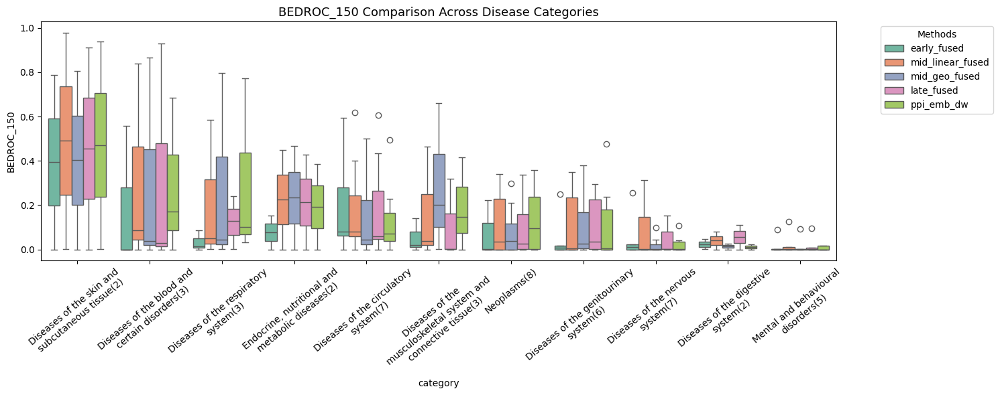

/tmp/ipykernel_1283391/2447229417.py:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


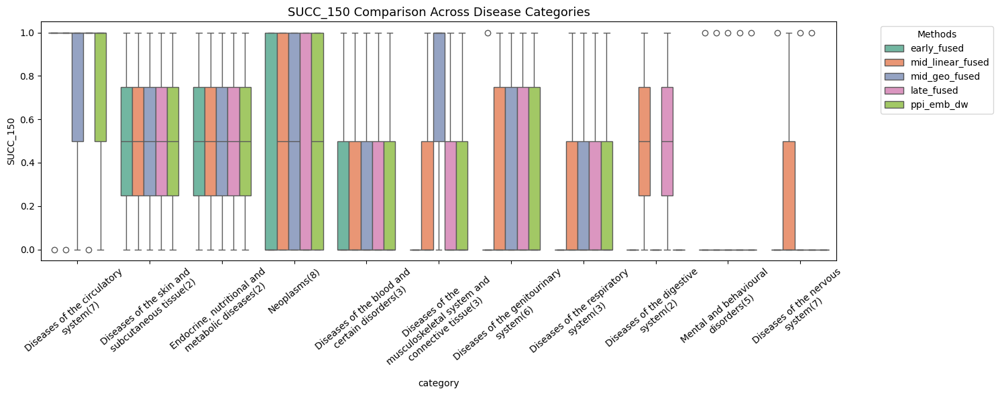

/tmp/ipykernel_1283391/2447229417.py:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


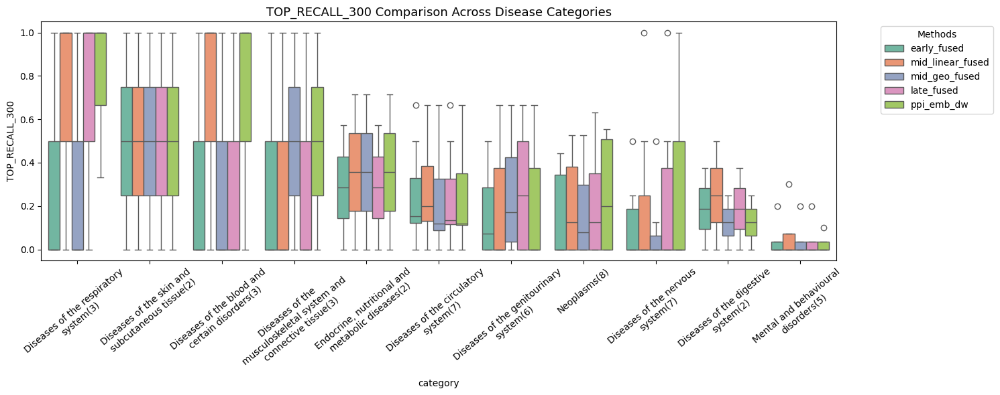

/tmp/ipykernel_1283391/2447229417.py:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


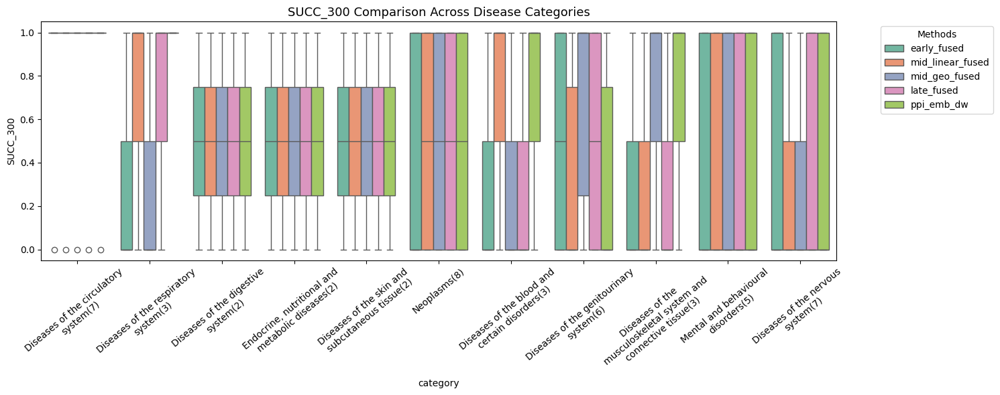

/tmp/ipykernel_1283391/2447229417.py:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


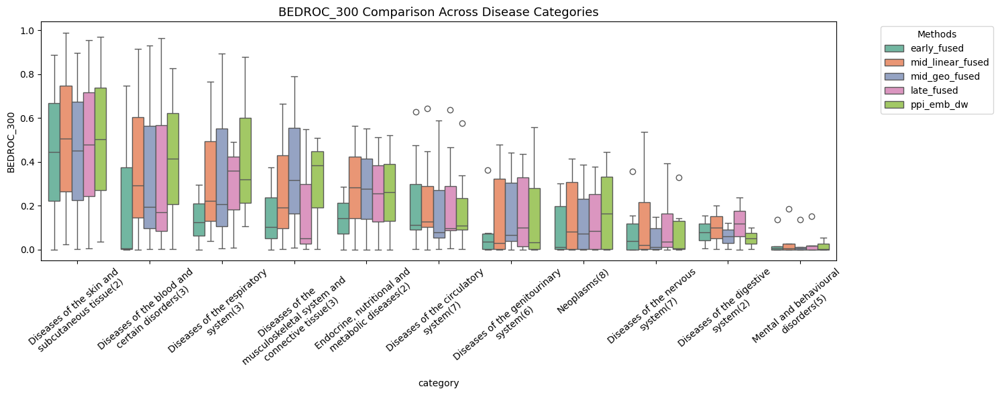

/tmp/ipykernel_1283391/2447229417.py:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


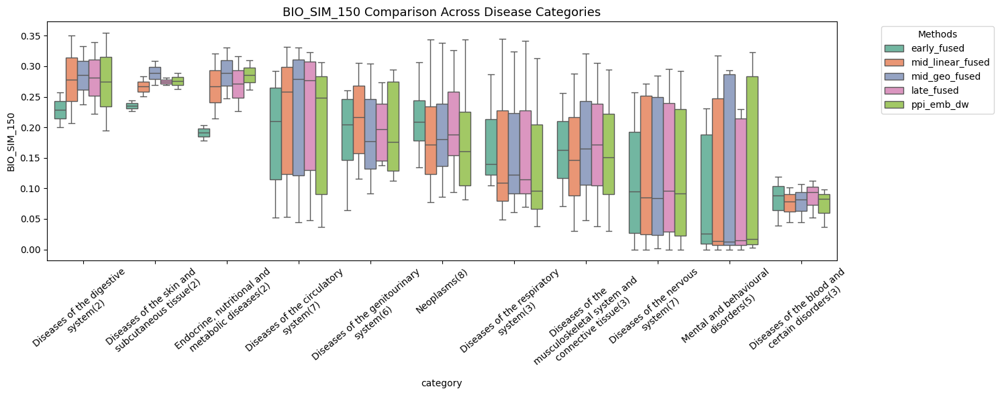

/tmp/ipykernel_1283391/2447229417.py:66: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


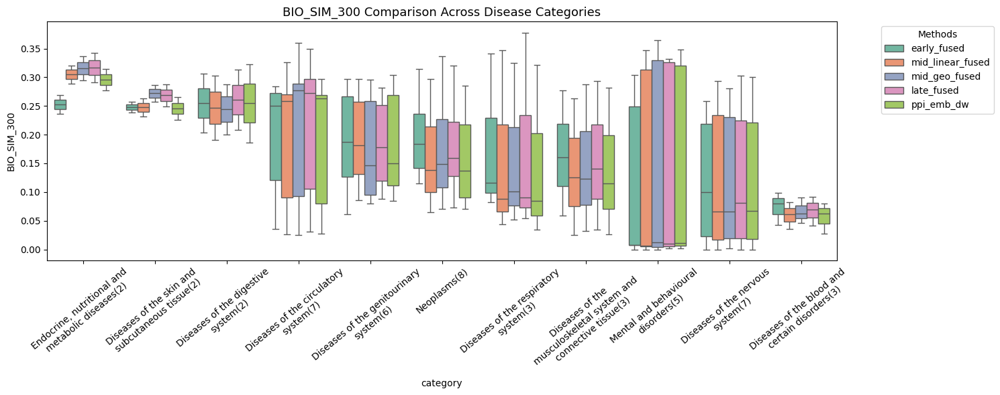

In [5]:
# selected_features = ['early_fused', 'early_fused_ppi', 'late_fused', 'late_fused_ppi','mid_fused', 'mid_fused_ppi', 'mid_geo_fused_ppi',
#        'mid_linear_fused', 'mid_linear_fused_ppi','mid_geo_fused']
selected_features = ['ppi_emb_dw','early_fused', 'late_fused', 'mid_fused','mid_linear_fused','mid_geo_fused']
subresults = merged_df[(merged_df['setting']=='df_gnn_occsvm_pred')&(merged_df['method'].isin(selected_features))]

# for metric in ['top_recall_300','top_recall_10%', 
#                'auroc', 'bedroc_1','bedroc_5', 'bedroc_10',
#                'succ_5%','succ_10%',
#                'w_recall_5%',  'w_recall_10%', 
#                'cutoff_0.11%','cutoff_0.22%']:
for metric in selected_metrics:
    plot_metric_boxplot(subresults, metric,['early_fused', 'mid_linear_fused', 'mid_geo_fused','late_fused','ppi_emb_dw'])


/tmp/ipykernel_201345/3850912397.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


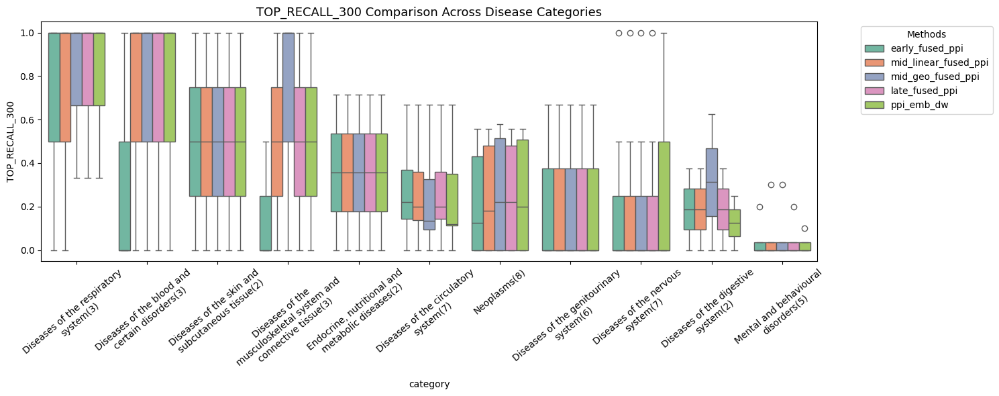

/tmp/ipykernel_201345/3850912397.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


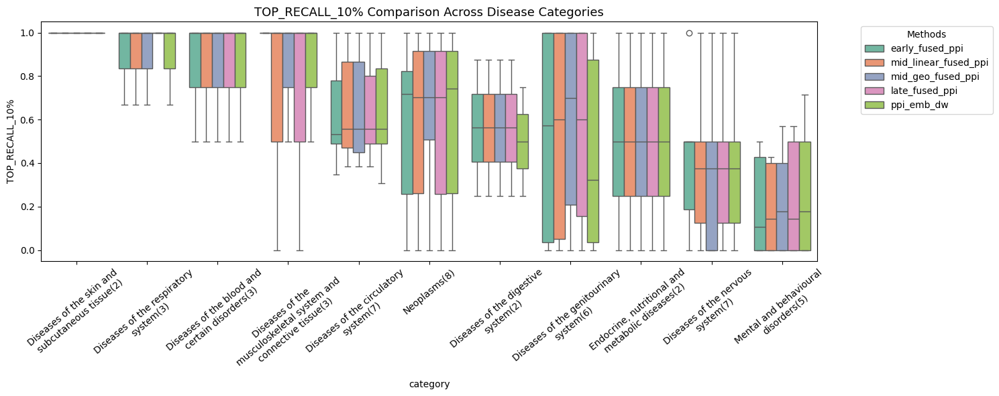

/tmp/ipykernel_201345/3850912397.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


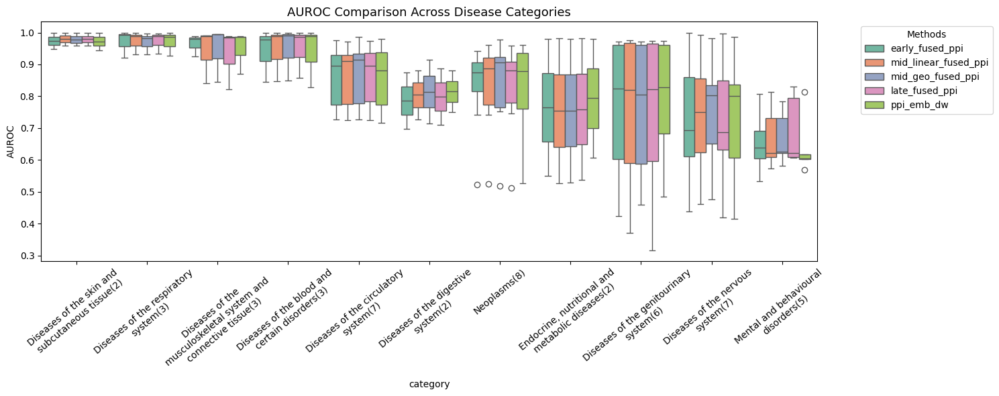

/tmp/ipykernel_201345/3850912397.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


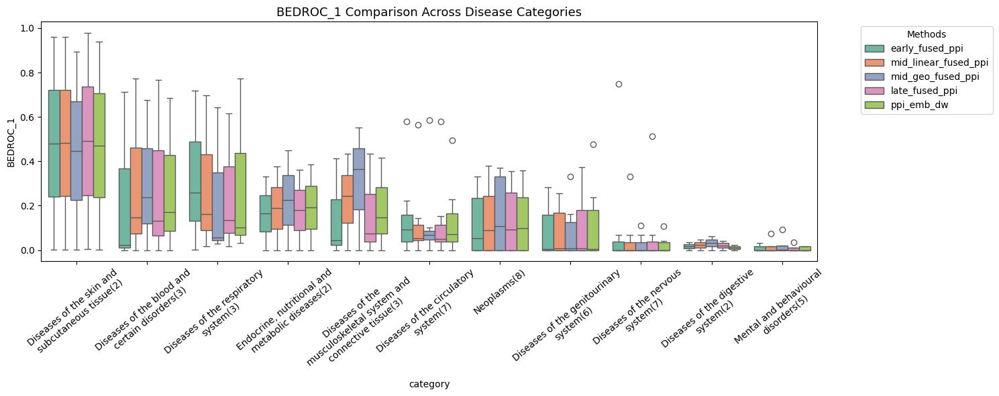

/tmp/ipykernel_201345/3850912397.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


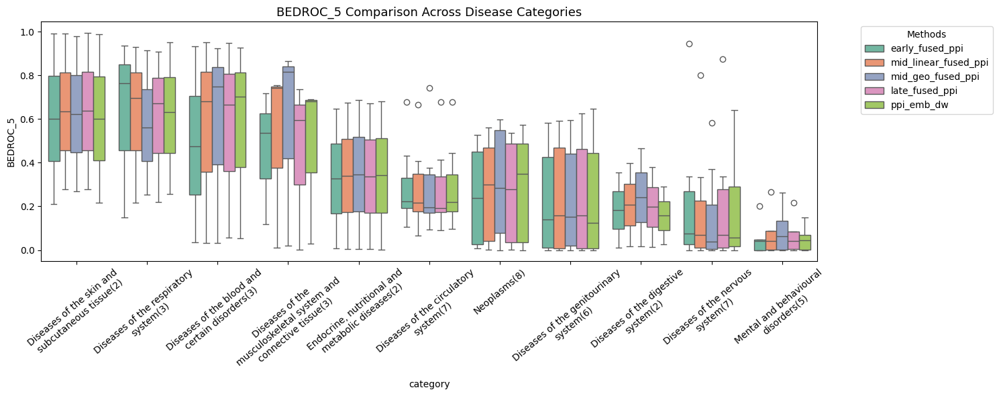

/tmp/ipykernel_201345/3850912397.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


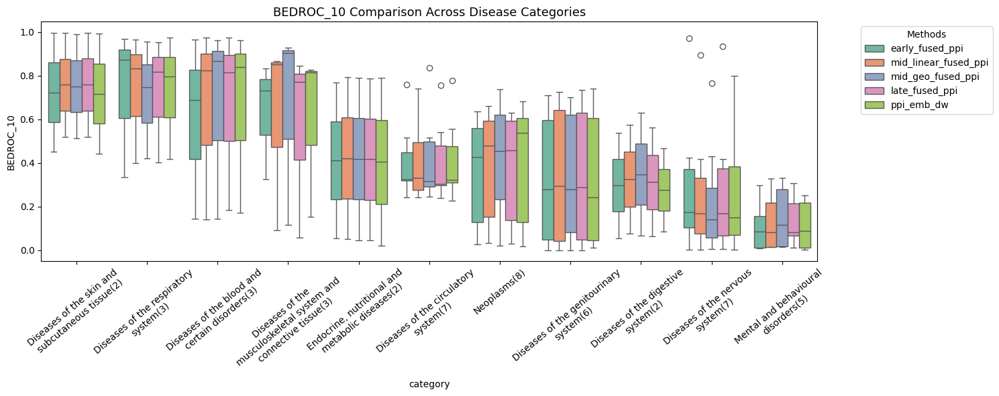

/tmp/ipykernel_201345/3850912397.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


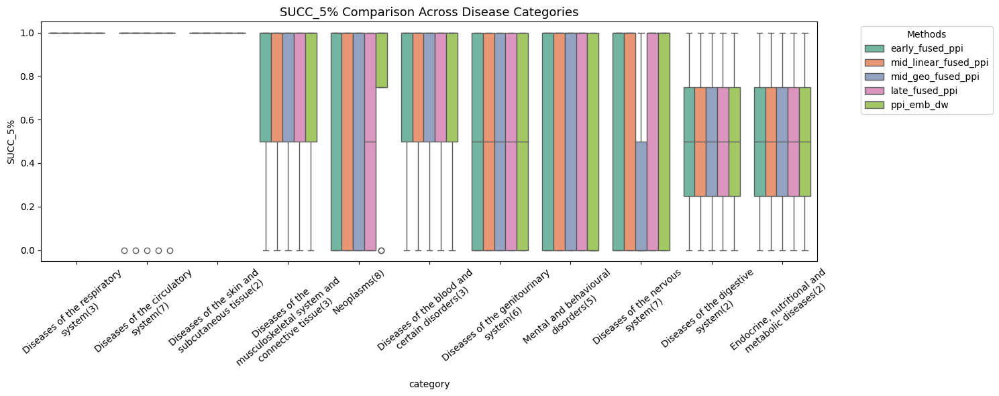

/tmp/ipykernel_201345/3850912397.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


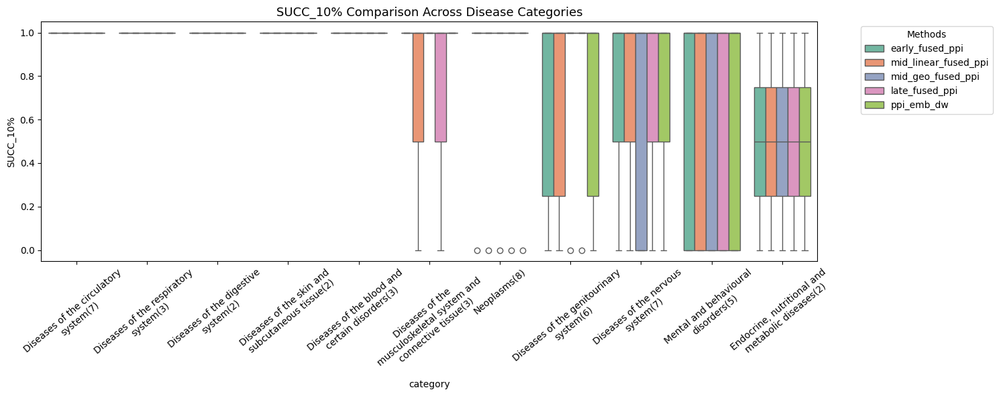

/tmp/ipykernel_201345/3850912397.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


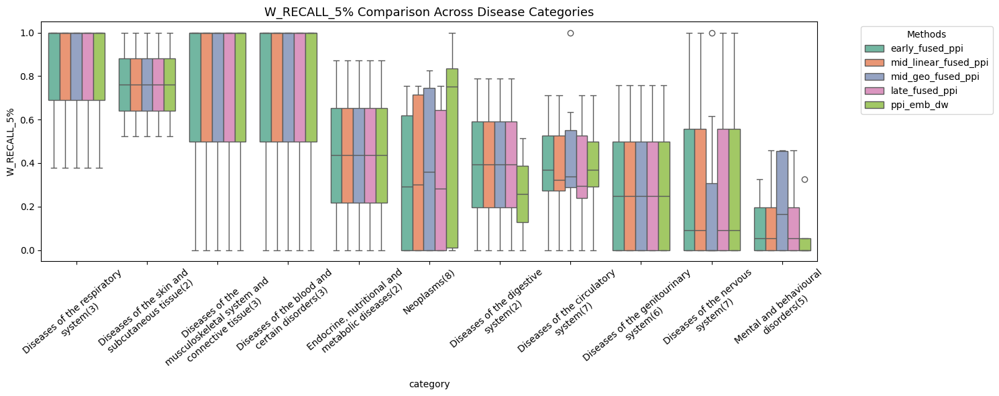

/tmp/ipykernel_201345/3850912397.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


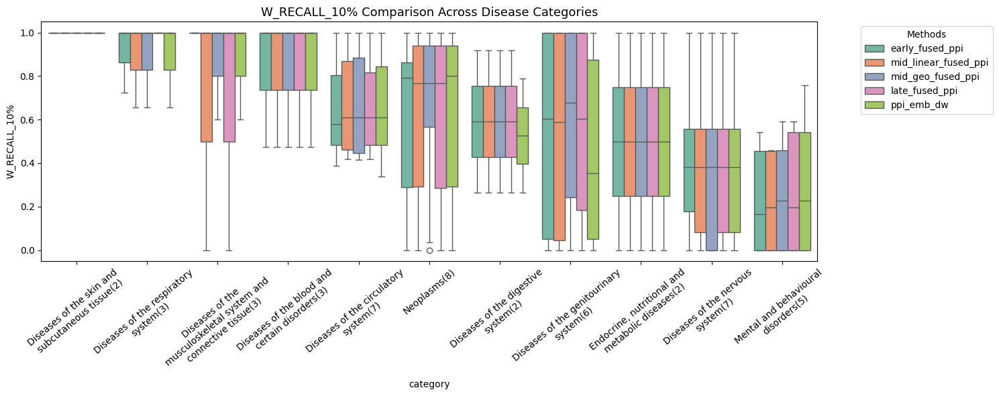

/tmp/ipykernel_201345/3850912397.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


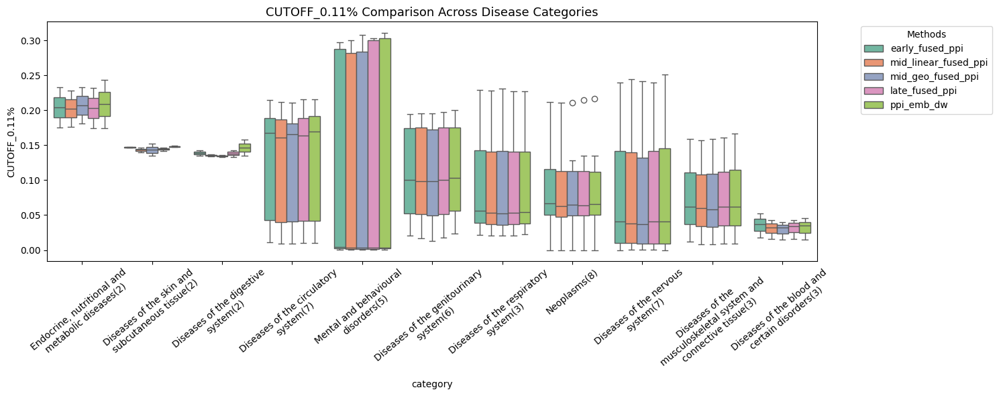

/tmp/ipykernel_201345/3850912397.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


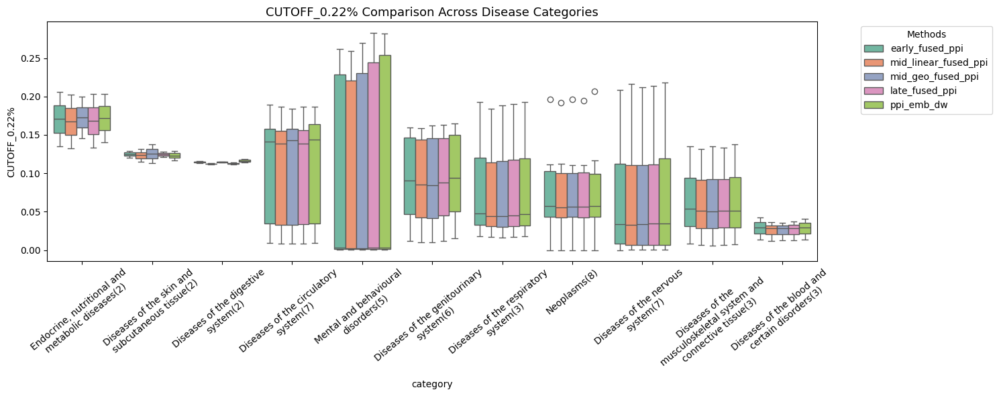

In [6]:
selected_features = ['ppi_emb_dw','early_fused', 'early_fused_ppi', 'late_fused', 'late_fused_ppi','mid_fused', 'mid_fused_ppi', 'mid_geo_fused_ppi',
       'mid_linear_fused', 'mid_linear_fused_ppi','mid_geo_fused']
# selected_features = ['ppi_emb_dw','early_fused', 'late_fused', 'mid_fused','mid_linear_fused','mid_geo_fused']
subresults = merged_df[(merged_df['setting']=='df_gnn_occsvm_pred')&(merged_df['method'].isin(selected_features))]

for metric in ['top_recall_300','top_recall_10%', 
               'auroc', 'bedroc_1','bedroc_5', 'bedroc_10',
               'succ_5%','succ_10%',
               'w_recall_5%',  'w_recall_10%', 
               'cutoff_0.11%','cutoff_0.22%']:
    plot_metric_boxplot(subresults, metric,['early_fused_ppi', 'mid_linear_fused_ppi', 'mid_geo_fused_ppi','late_fused_ppi','ppi_emb_dw'])


/tmp/ipykernel_201345/3850912397.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


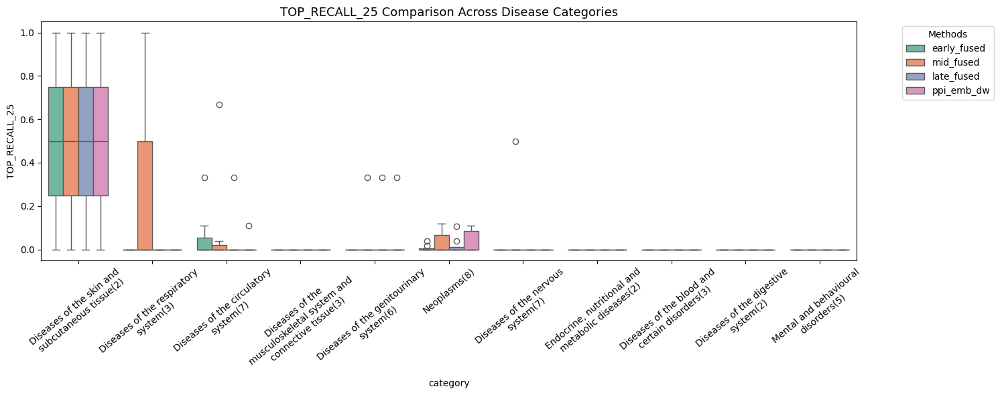

/tmp/ipykernel_201345/3850912397.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


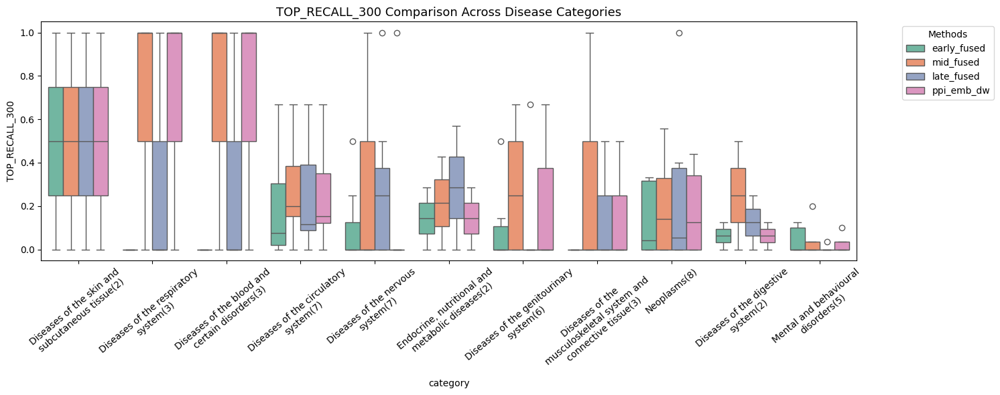

/tmp/ipykernel_201345/3850912397.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


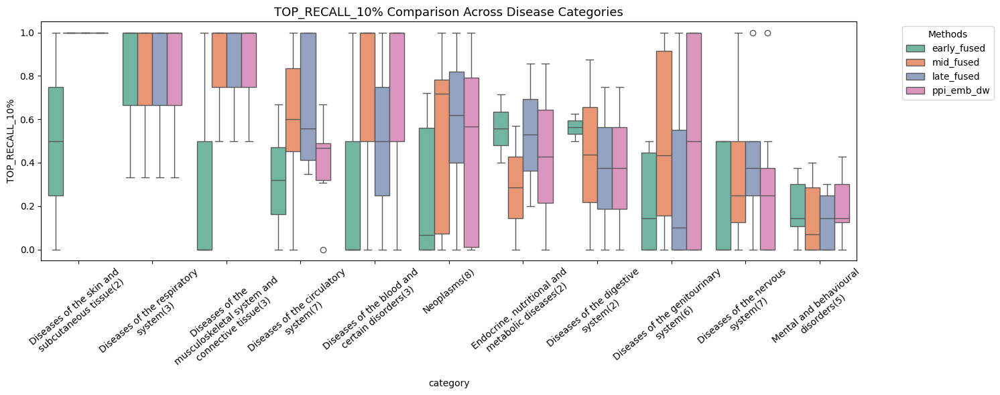

/tmp/ipykernel_201345/3850912397.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


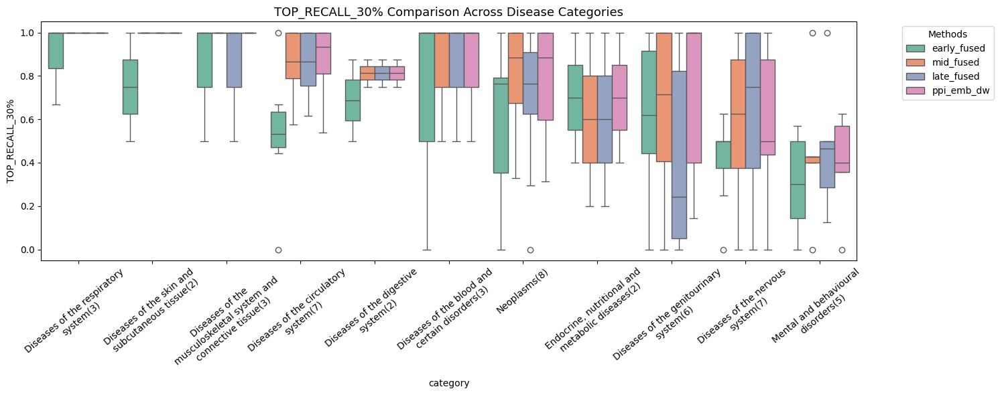

/tmp/ipykernel_201345/3850912397.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


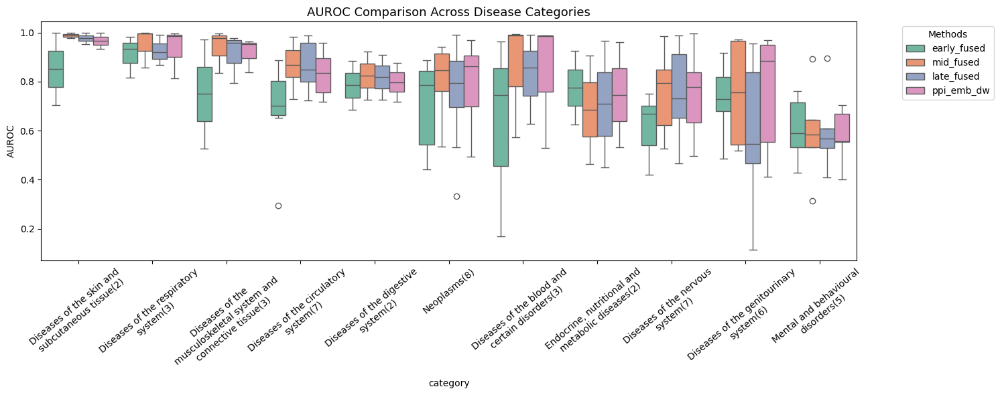

/tmp/ipykernel_201345/3850912397.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


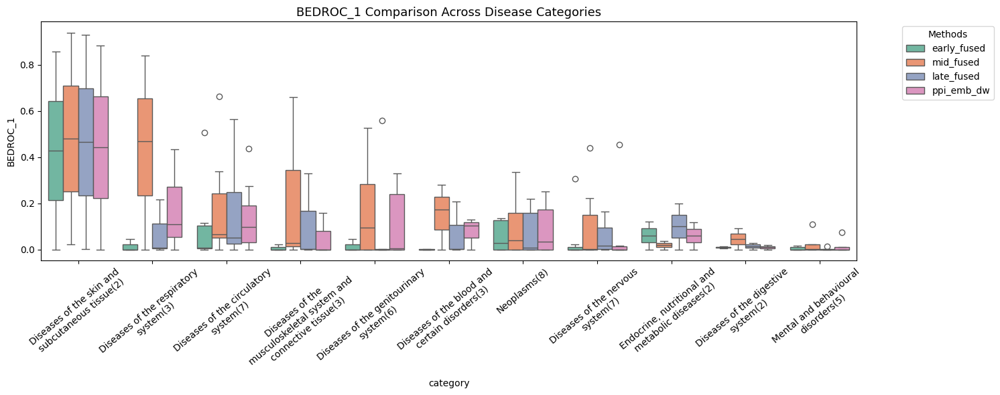

/tmp/ipykernel_201345/3850912397.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


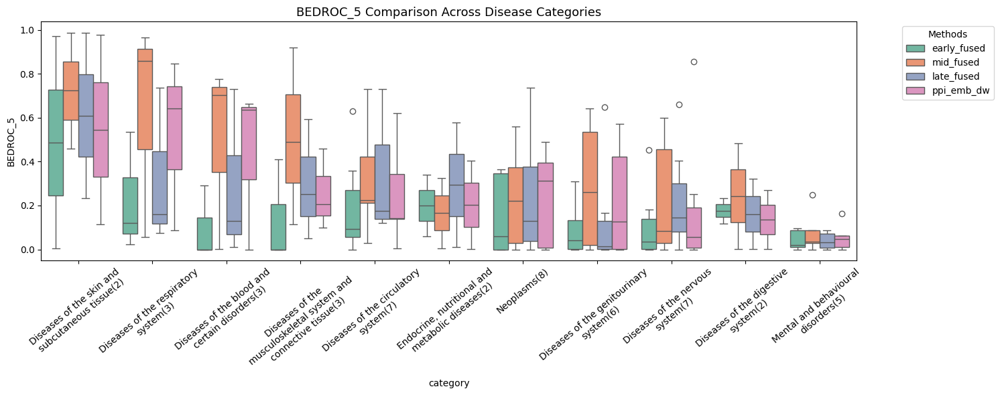

/tmp/ipykernel_201345/3850912397.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


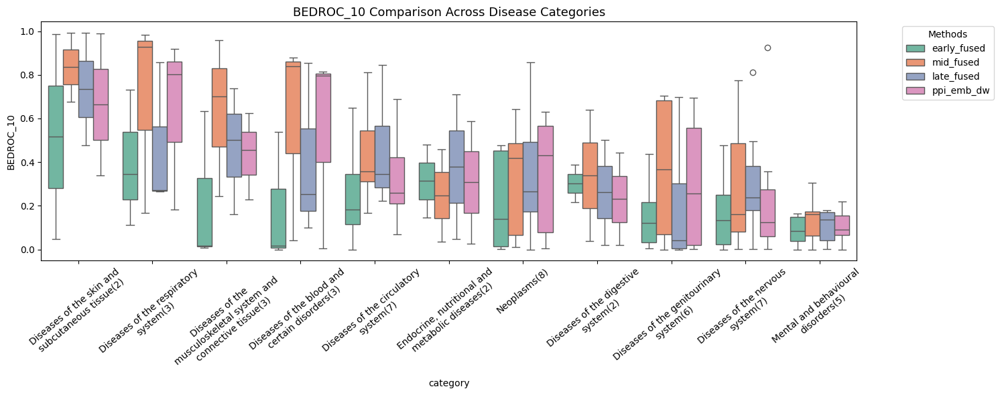

/tmp/ipykernel_201345/3850912397.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


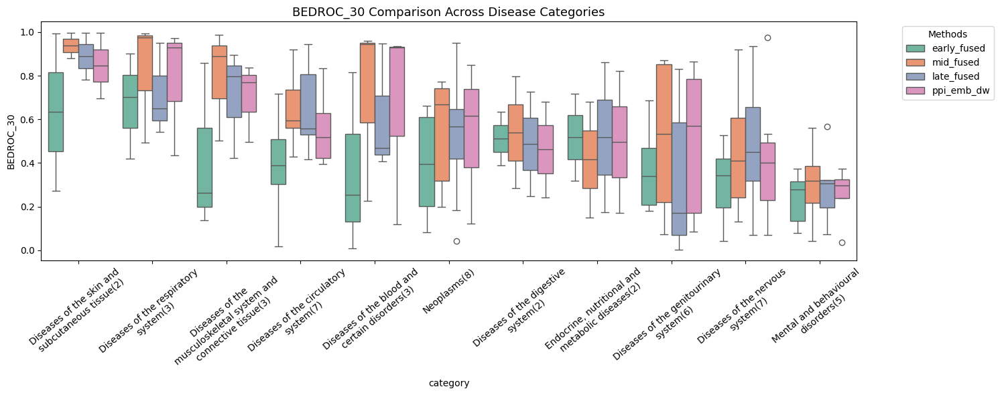

/tmp/ipykernel_201345/3850912397.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


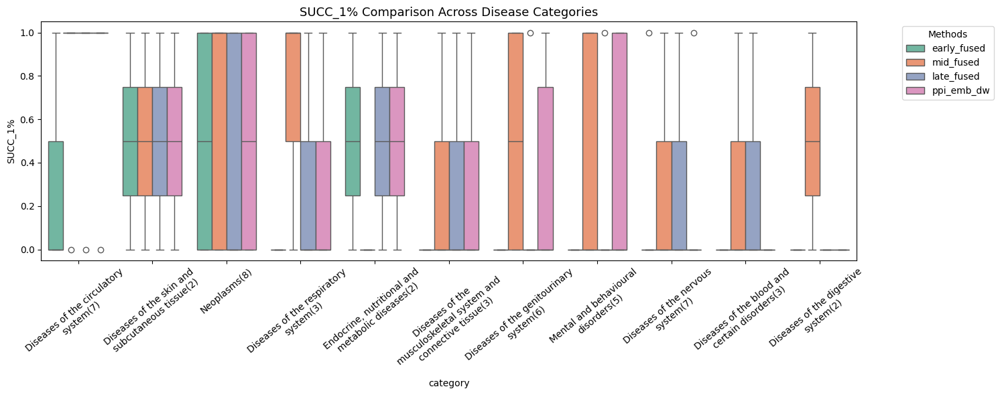

/tmp/ipykernel_201345/3850912397.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


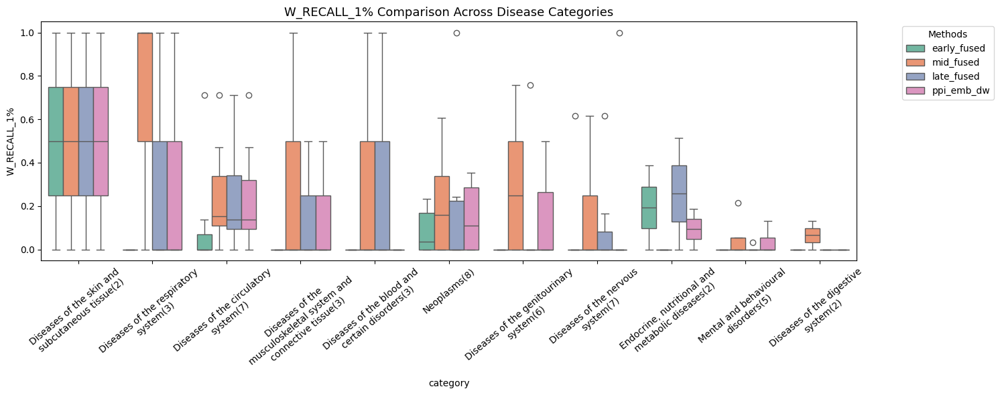

/tmp/ipykernel_201345/3850912397.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


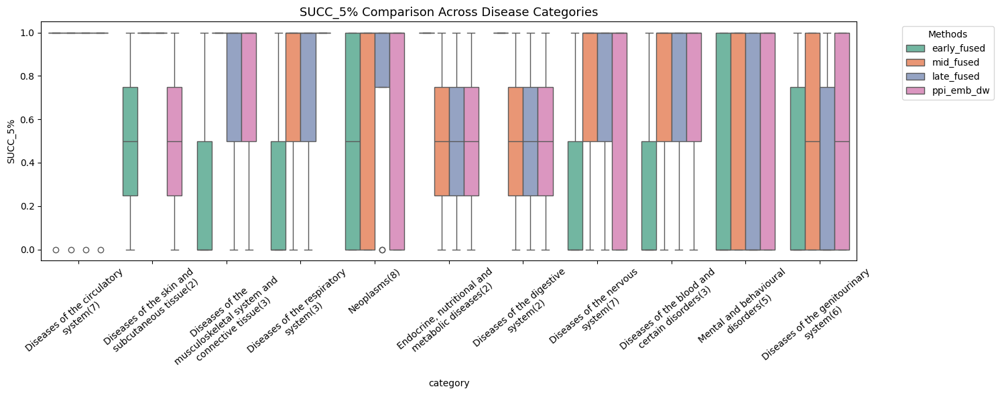

/tmp/ipykernel_201345/3850912397.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


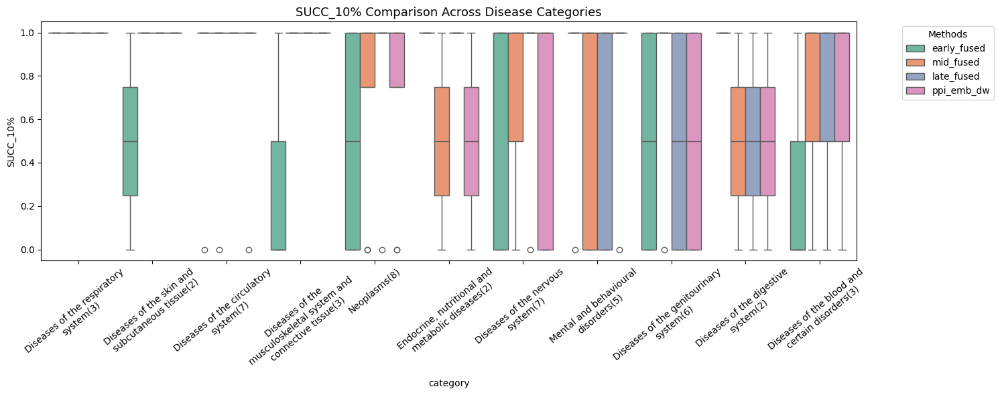

/tmp/ipykernel_201345/3850912397.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


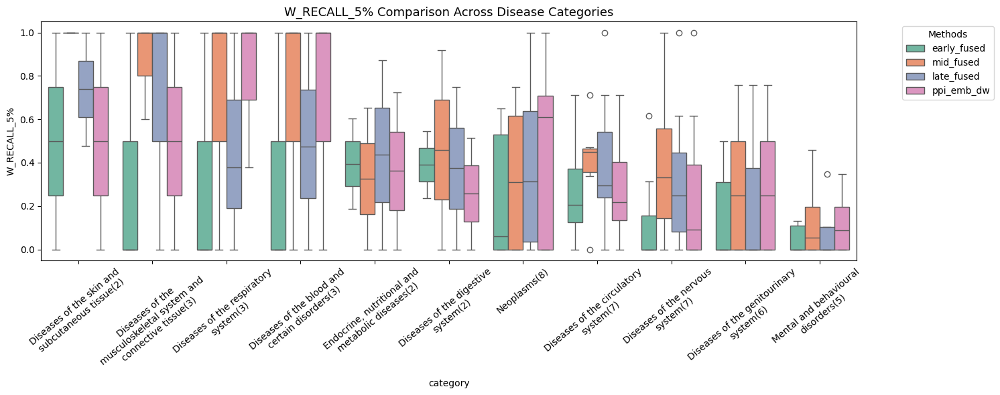

/tmp/ipykernel_201345/3850912397.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


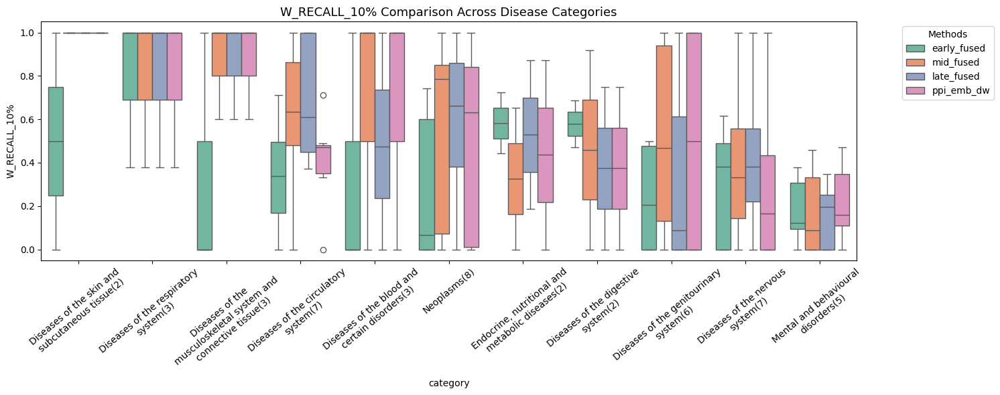

/tmp/ipykernel_201345/3850912397.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


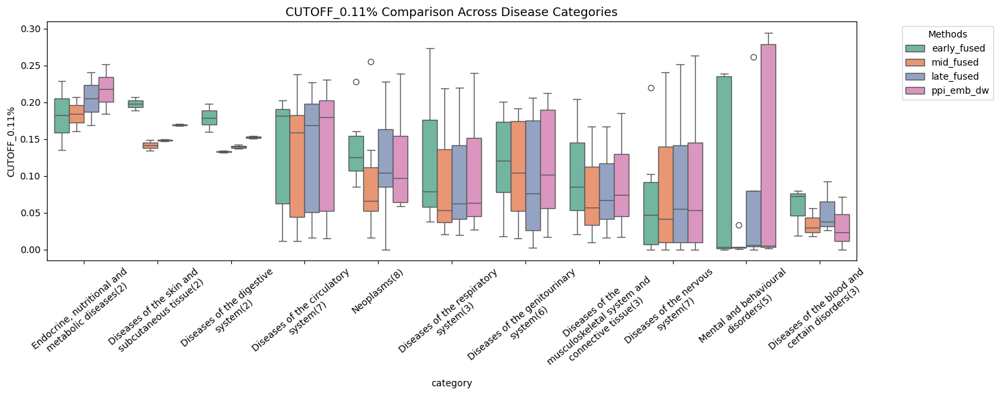

/tmp/ipykernel_201345/3850912397.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


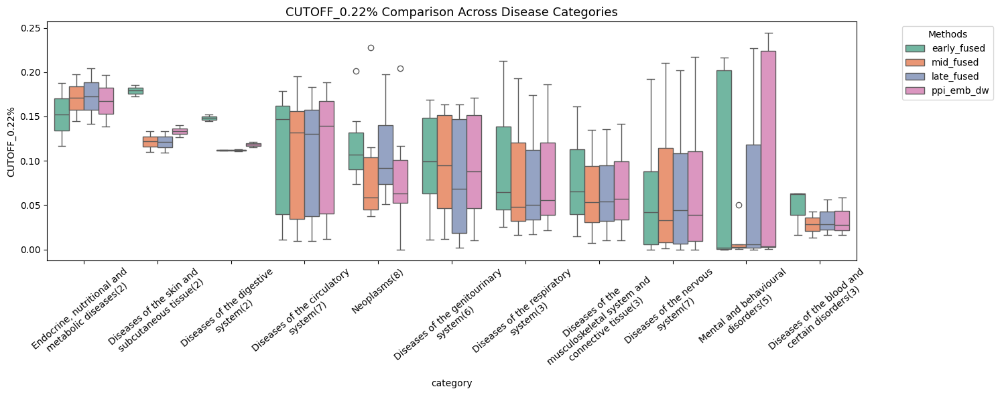

In [5]:
selected_features = ['ppi_emb_dw','early_fused', 'early_fused_ppi', 'late_fused', 'late_fused_ppi','mid_fused', 'mid_fused_ppi', 'mid_geo_fused_ppi',
       'mid_linear_fused', 'mid_linear_fused_ppi','mid_geo_fused']

subresults = merged_df[(merged_df['setting']=='2019_nn_all_pred')&(merged_df['method'].isin(selected_features))]

for metric in ['top_recall_25', 'top_recall_300','top_recall_10%', 'top_recall_30%', 
               'auroc', 'bedroc_1','bedroc_5', 'bedroc_10', 'bedroc_30', 
               'succ_1%', 'w_recall_1%', 'succ_5%','succ_10%',
               'w_recall_5%',  'w_recall_10%', 
               'cutoff_0.11%','cutoff_0.22%']:
    plot_metric_boxplot(subresults, metric,['early_fused', 'mid_fused','late_fused','ppi_emb_dw'])


/tmp/ipykernel_201345/3850912397.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


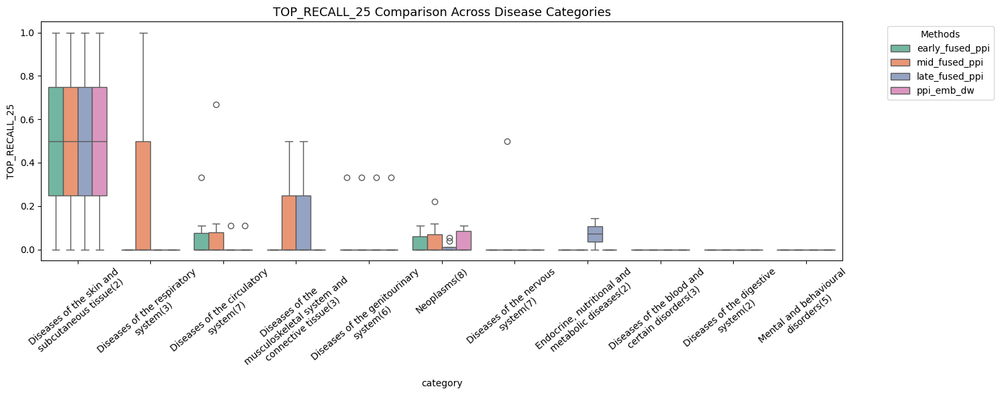

/tmp/ipykernel_201345/3850912397.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


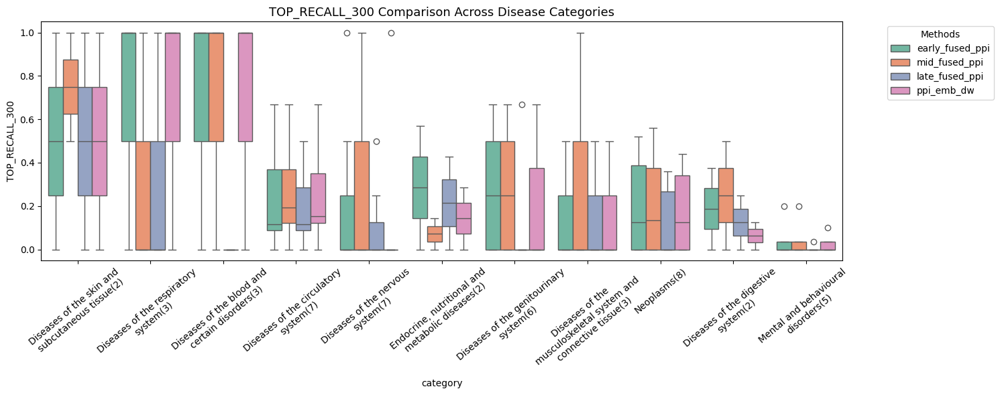

/tmp/ipykernel_201345/3850912397.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


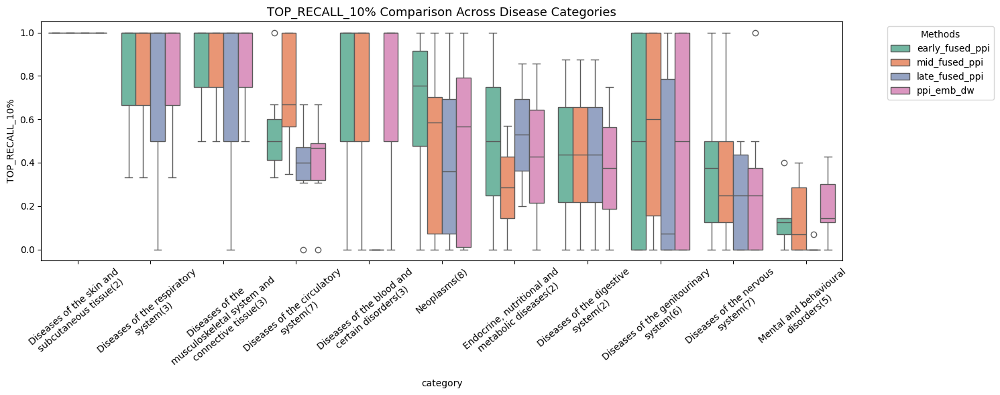

/tmp/ipykernel_201345/3850912397.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


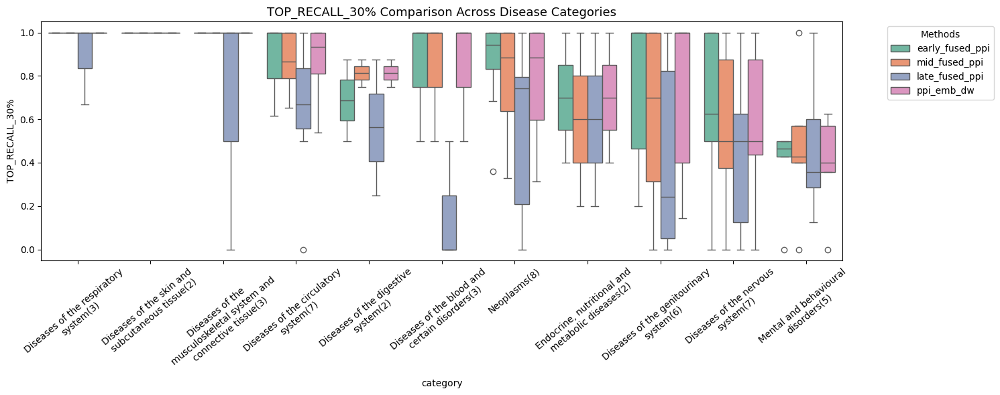

/tmp/ipykernel_201345/3850912397.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


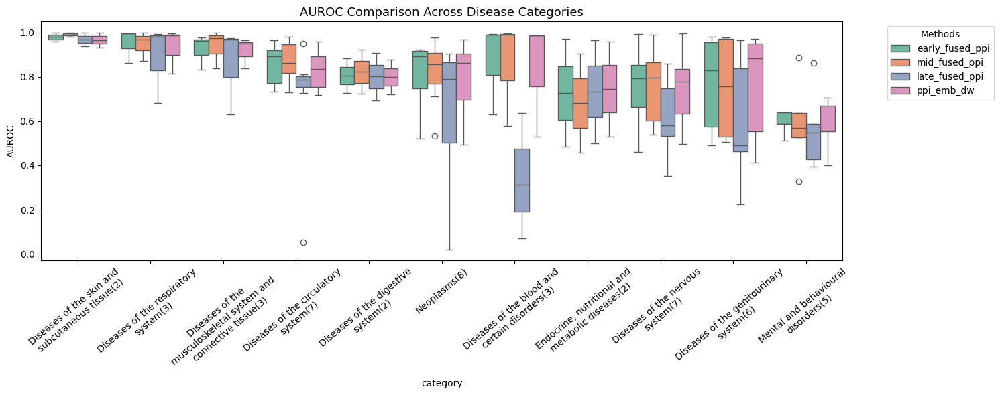

/tmp/ipykernel_201345/3850912397.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


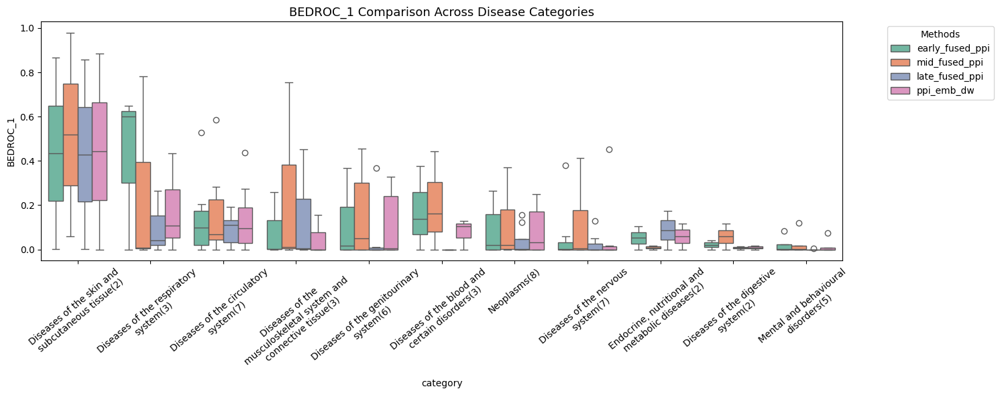

/tmp/ipykernel_201345/3850912397.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


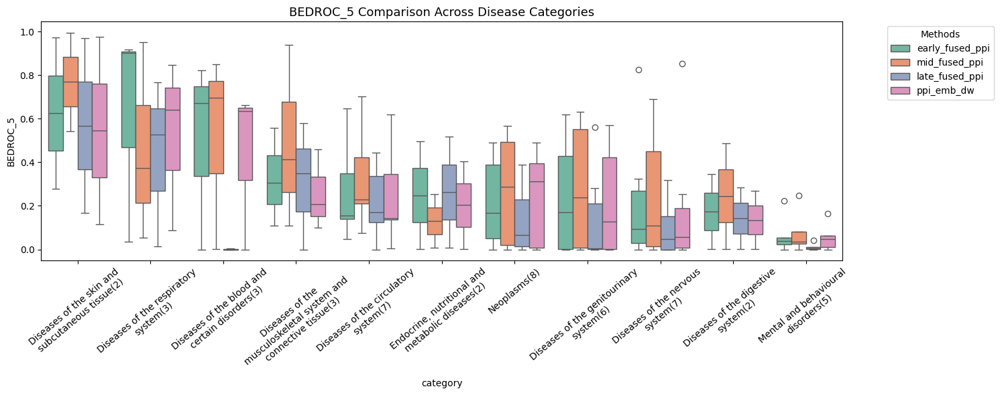

/tmp/ipykernel_201345/3850912397.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


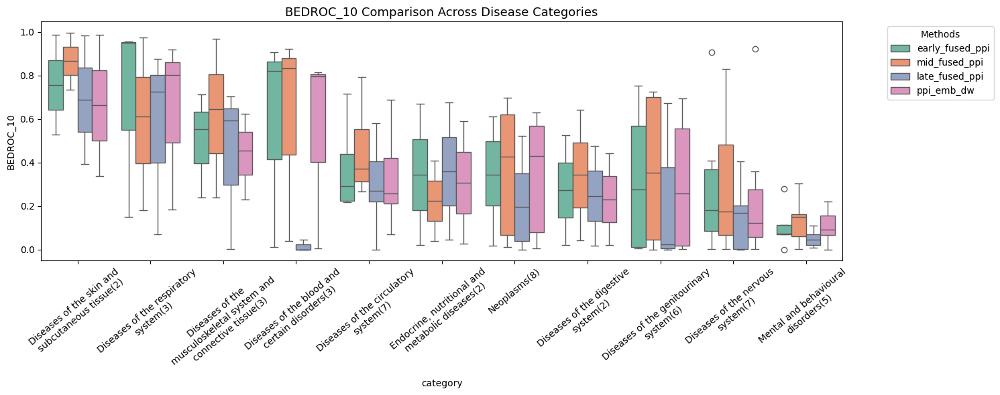

/tmp/ipykernel_201345/3850912397.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


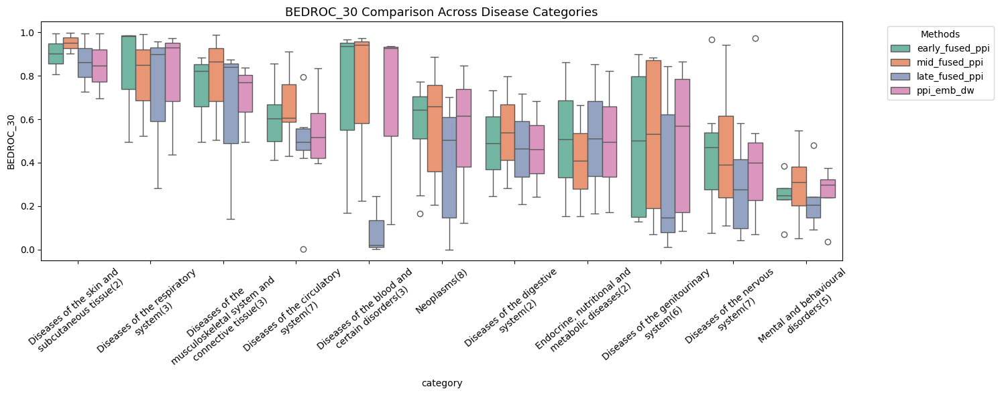

/tmp/ipykernel_201345/3850912397.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


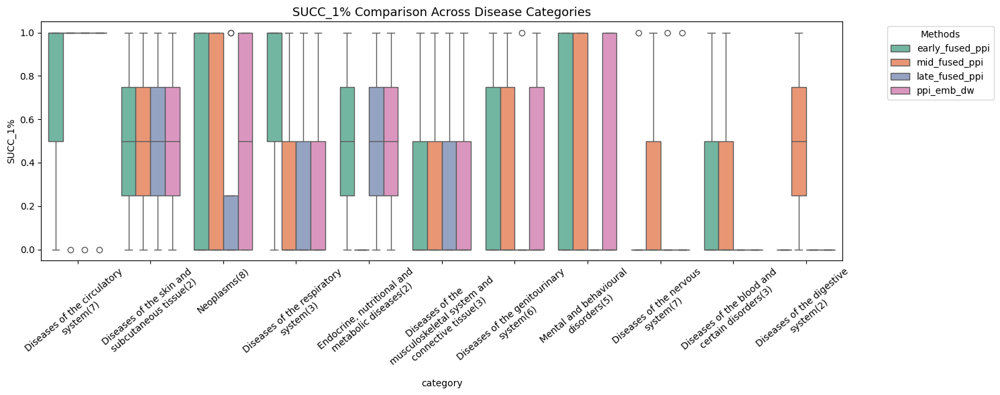

/tmp/ipykernel_201345/3850912397.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


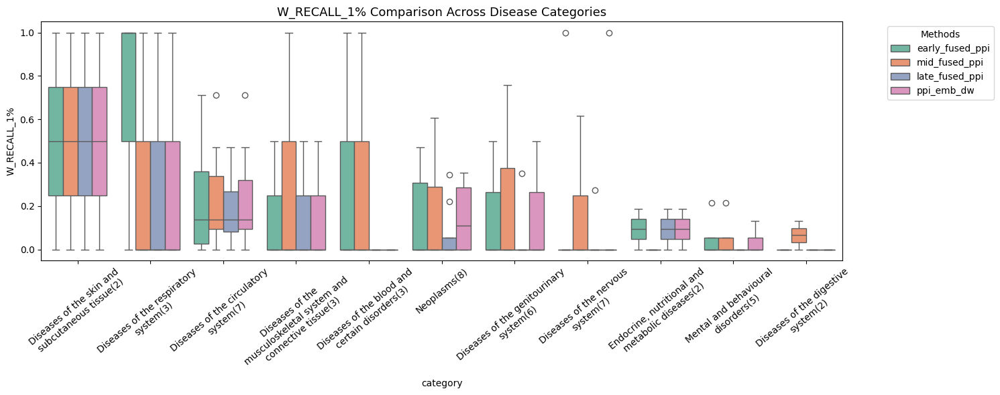

/tmp/ipykernel_201345/3850912397.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


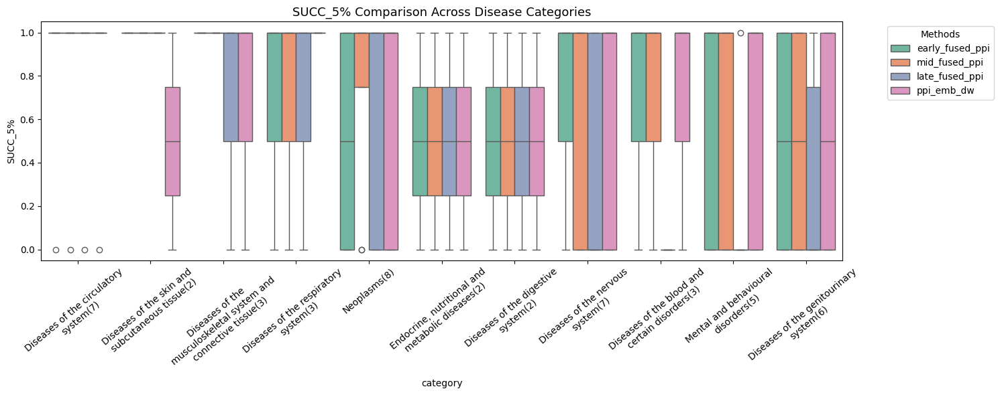

/tmp/ipykernel_201345/3850912397.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


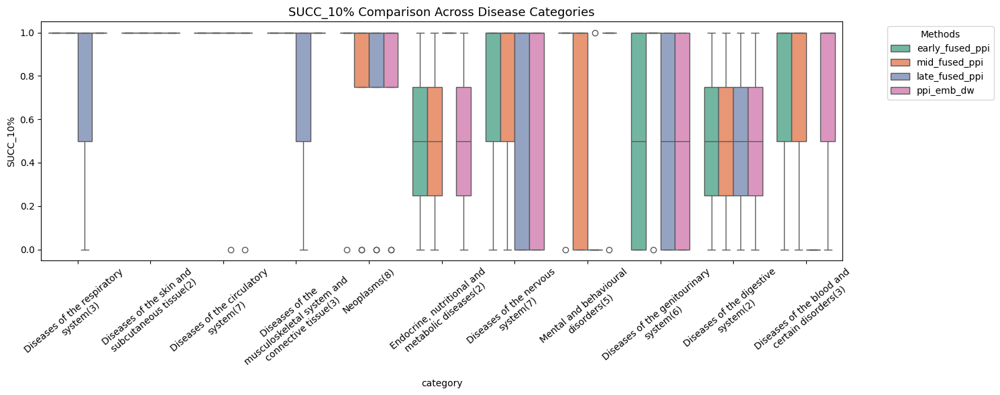

/tmp/ipykernel_201345/3850912397.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


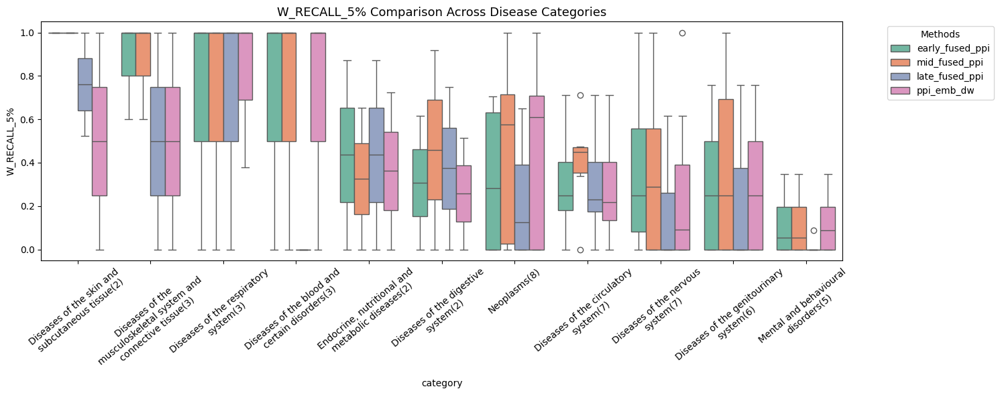

/tmp/ipykernel_201345/3850912397.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


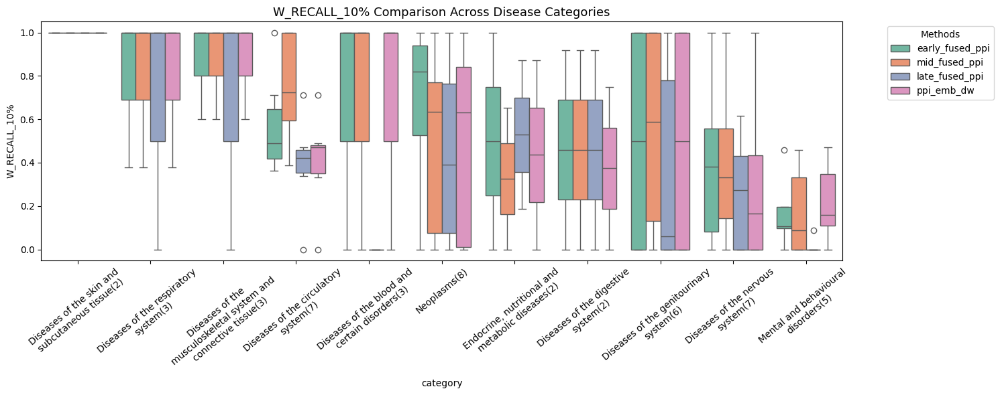

/tmp/ipykernel_201345/3850912397.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


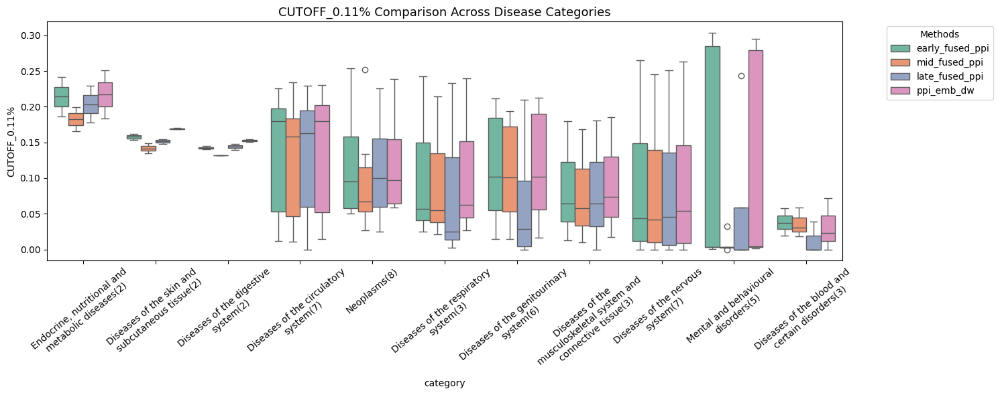

/tmp/ipykernel_201345/3850912397.py:64: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(new_labels, rotation=40, ha='center')


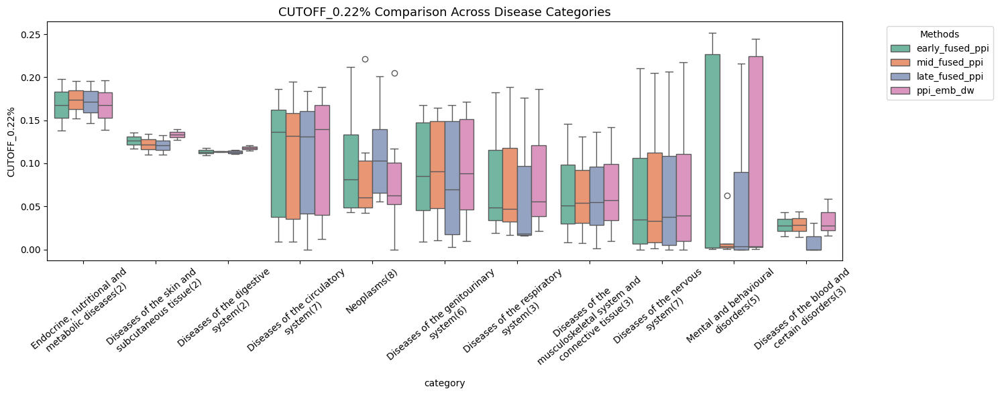

In [7]:
selected_features = ['ppi_emb_dw','early_fused', 'early_fused_ppi', 'late_fused', 'late_fused_ppi','mid_fused', 'mid_fused_ppi', 'mid_geo_fused_ppi',
       'mid_linear_fused', 'mid_linear_fused_ppi','mid_geo_fused']

subresults = merged_df[(merged_df['setting']=='2019_nn_all_pred')&(merged_df['method'].isin(selected_features))]

for metric in ['top_recall_25', 'top_recall_300','top_recall_10%', 'top_recall_30%', 
               'auroc', 'bedroc_1','bedroc_5', 'bedroc_10', 'bedroc_30', 
               'succ_1%', 'w_recall_1%', 'succ_5%','succ_10%',
               'w_recall_5%',  'w_recall_10%', 
               'cutoff_0.11%','cutoff_0.22%']:
    plot_metric_boxplot(subresults, metric,['early_fused_ppi', 'mid_fused_ppi','late_fused_ppi','ppi_emb_dw'])
